# Introduction
OpenCV (Open Source Computer Vision Library: http://opencv.org) is an open-source BSD-licensed library that includes several hundreds of computer vision algorithms. Lets just quickly get started on how to use this library, but first lets import this library and along with it lets also import matplotlib.pyplot and numpy for convenience.

In [2]:
import cv2                                              # OpenCV - For image processing
import numpy as np                                      # NumPy - For image matrix manipulation 
import matplotlib.pyplot as plt                         # Pyplot - For visualization

## Getting Started with Images
### Read an image
Use the function cv2.imread() to read an image. The image should be in the working directory or a full path of image should be given. Second argument is a flag which specifies the way image should be read.  
* cv2.IMREAD_COLOR : Loads a color image. Any transparency of image will be neglected. It is the default flag.
* cv2.IMREAD_GRAYSCALE : Loads image in grayscale mode
* cv2.IMREAD_UNCHANGED : Loads image as such including alpha channel  
**Note** Instead of these three flags, you can simply pass integers 1, 0 or -1 respectively.

In [131]:
img = cv2.imread('Images/flower.jpg',1)                  # Load an color image in grayscale

### Display an image
Use the function cv2.imshow() to display an image in a window. The window automatically fits to the image size. We can also use matplotlib to display images, but remember to invert the color ordering because as matplotlib uses [r,g,b], whereas opencv uses [b,g,r]. 

In [132]:
cv2.imshow('Image Title',img[::2,::2])                  # img here here is reduced to half of its original size         
cv2.waitKey(0)                                          # Wait indifinite for user input
cv2.destroyAllWindows()                                 # destroy the window there by closing it

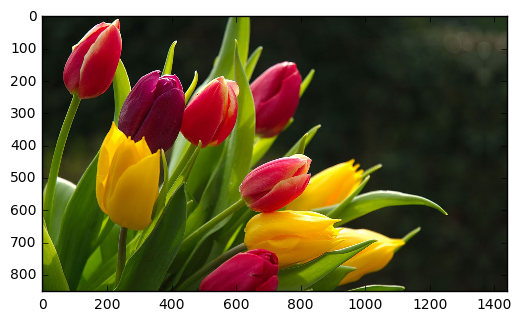

In [133]:
plt.imshow(img[:,:,::-1])                               # Note we have inverted the color dimention of image
plt.show()                                              # show the plot

## Getting Started with Videos
### Capture Video from Camera
To capture a video, you need to create a VideoCapture object. Its argument can be either the device index or the name of a video file. Device index is just the number to specify which camera. Normally one camera will be connected (as in my case). So I simply pass 0 (or -1). You can select the second camera by passing 1 and so on. After that, you can capture frame-by-frame. But at the end, don’t forget to release the capture.

In [3]:
cap = cv2.VideoCapture(0)                                           # Replace 0 by the device index of your camera
ret = True
while(ret == True):
    # Capture frame-by-frame
    ret, frame = cap.read()                                         # Read a single frame
    if(ret == True):
        # Our operations on the frame come here
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Display the resulting frame
        cv2.imshow('frame',gray)
        if cv2.waitKey(40) & 0xFF == ord('q'):                      # Stop playing video when 'q' is pressed
            break

# When everything done, release the capture
cap.release()
cv2.destroyAllWindows()

cap may not have initialized the capture. In that case, this code shows error. You can check whether it is initialized or not by the method cap.isOpened(). If it is True, OK. Otherwise open it using cap.open().

You can also access some of the features of this video using cap.get(propId) method where propId is a number from 0 to 18. Each number denotes a property of the video (if it is applicable to that video) and full details can be seen here: Property Identifier. Some of these values can be modified using cap.set(propId, value). Value is the new value you want.

For example, I can check the frame width and height by cap.get(3) and cap.get(4). It gives me 640x480 by default. But I want to modify it to 320x240. Just use ret = cap.set(3,320) and ret = cap.set(4,240).
### Playing Video from file
It is same as capturing from Camera, just change camera index with video file name. Also while displaying the frame, use appropriate time for cv2.waitKey(). If it is too less, video will be very fast and if it is too high, video will be slow (Well, that is how you can display videos in slow motion). 25 milliseconds will be OK in normal cases.

In [4]:
cap = cv2.VideoCapture('Images\\tree.avi')                                           # Replace 0 by the device index of your camera
ret = True
while(ret == True):
    # Capture frame-by-frame
    ret, frame = cap.read()                                         # Read a single frame
    if(ret == True):
        # Our operations on the frame come here
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Display the resulting frame
        cv2.imshow('frame',gray)
        if cv2.waitKey(40) & 0xFF == ord('q'):                      # Stop playing video when 'q' is pressed
            break

# When everything done, release the capture
cap.release()
cv2.destroyAllWindows()

### Saving a Video
In order to save to a file we create a VideoWriter object. We should specify the output file name (eg: output.avi). Then we should specify the FourCC code (details in next paragraph). Then number of frames per second (fps) and frame size should be passed. And last one is isColor flag. If it is True, encoder expect color frame, otherwise it works with grayscale frame.

FourCC is a 4-byte code used to specify the video codec. The list of available codes can be found in fourcc.org. It is platform dependent. FourCC code is passed as cv2.VideoWriter_fourcc('M','J','P','G') or cv2.VideoWriter_fourcc(*'MJPG) for MJPG.

In [5]:
cap = cv2.VideoCapture('Images\\tree.avi')

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('Images\\output_tree.avi',fourcc, 20.0, (640,480))

while(cap.isOpened()):
    ret, frame = cap.read()
    if ret==True:
        frame = cv2.flip(frame,0)                   # The frame is flipped upside down                      

        # write the flipped frame
        out.write(frame)

        cv2.imshow('frame',frame)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    else:
        break

# Release everything if job is finished
cap.release()
out.release()
cv2.destroyAllWindows()

## Drawing Functions in OpenCV
Here we will learn to draw different geometric shapes with OpenCV like lines, circle, rectangle, ellipse and text. Let see an example for each of these inbuilt functions-
### Drawing line
To draw a line, you need to pass starting and ending coordinates of line.

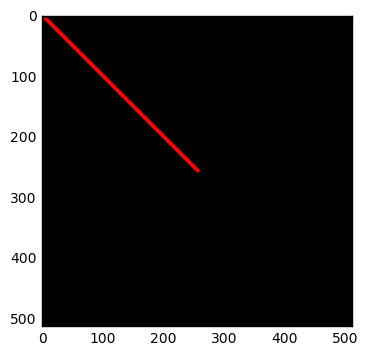

In [134]:
img = np.zeros((512,512,3), np.uint8)                  # Generating a black image of size 512 X 512 X 3
cv2.line(img,(0,0),(256,256),(255,0,0),5)              # last argument is the thickness of line in pixel
                                                       # Third argument is the color of the drawn line
_ = plt.imshow(img[:,:,:]), plt.show()                 # underscore(_) here denotes we dont care about returned value

### Drawing Rectangle
To draw a rectangle, you need top-left corner and bottom-right corner of rectangle. This time we will draw a green rectangle at the top-right corner of image. The co-ordinate system used here of how display works and its not according to how numpy stores image internally where rows are vertical displacement and columns are horizontal displacement.

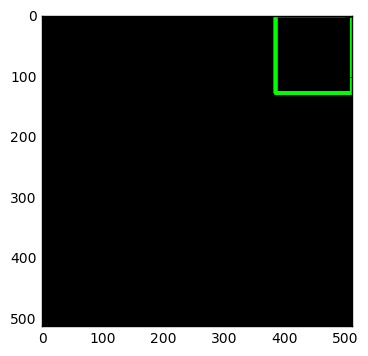

In [135]:
img = np.zeros((512,512,3), np.uint8) 
cv2.rectangle(img,(384,0),(510,128),(0,255,0),5)      
_ = plt.imshow(img[:,:,::-1]), plt.show() 

### Drawing Circle
To draw a circle, you need its center coordinates and radius. We will draw a circle inside the rectangle drawn above.

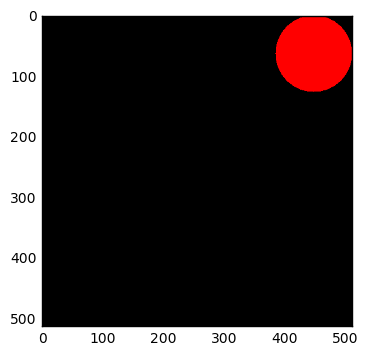

In [136]:
img = np.zeros((512,512,3), np.uint8) 
cv2.circle(img,(447,63), 63, (0,0,255), -1)           # -1 as the last coordinate means fill the diagram with the specified color
_ = plt.imshow(img[:,:,::-1]), plt.show() 

### Drawing Ellipse
To draw the ellipse, we need to pass several arguments. One argument is the center location (x,y). Next argument is axes lengths (major axis length, minor axis length). angle is the angle of rotation of ellipse in anti-clockwise direction. startAngle and endAngle denotes the starting and ending of ellipse arc measured in clockwise direction from major axis. i.e. giving values 0 and 360 gives the full ellipse. ![Ellipse Parameters](Images\ellipse.png)

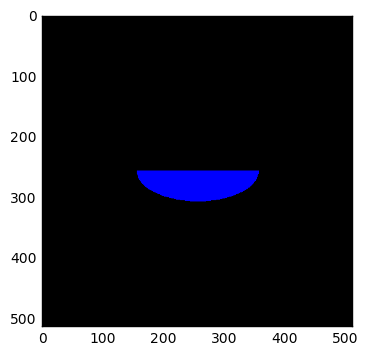

In [137]:
img = np.zeros((512,512,3), np.uint8) 
cv2.ellipse(img,(256,256),(100,50),0,0,180,255,-1)
_ = plt.imshow(img[:,:,::-1]), plt.show() 

### Drawing Polygon
To draw a polygon, first you need coordinates of vertices. Make those points into an array of shape ROWSx1x2 where ROWS are number of vertices and it should be of type int32. Coordinate system here is same as that we used in rectangle. Here we draw a small polygon of with four vertices in yellow color.

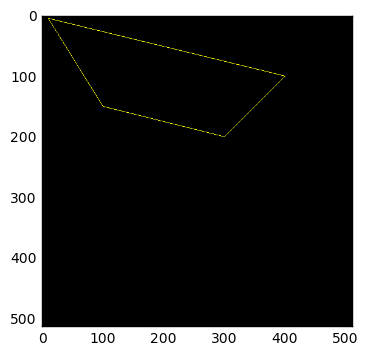

In [138]:
img = np.zeros((512,512,3), np.uint8) 
pts = np.array([[10,5],[400,100],[300,200],[100,150]], np.int32)
pts = pts.reshape((-1,1,2))                                      # we could also do  <=>   pts = pts[:,np.newaxis,:]
cv2.polylines(img,[pts],True,(0,255,255))                        # If third argument is False, you will get a polylines joining 
                                                                 # all the points, not a closed shape. 
_ = plt.imshow(img[:,:,::-1]), plt.show() 

### Adding Text to Images
To put texts in images, you need specify following things.
* Text data that you want to write
* Position coordinates of where you want put it (i.e. bottom-left corner where data starts).
* Font type
  * FONT_HERSHEY_SIMPLEX = 0,
  * FONT_HERSHEY_PLAIN = 1,
  * FONT_HERSHEY_DUPLEX = 2,
  * FONT_HERSHEY_COMPLEX = 3,
  * FONT_HERSHEY_TRIPLEX = 4,
  * FONT_HERSHEY_COMPLEX_SMALL = 5,
  * FONT_HERSHEY_SCRIPT_SIMPLEX = 6,
  * FONT_HERSHEY_SCRIPT_COMPLEX = 7,
  * FONT_ITALIC = 16
* Font Scale (specifies the size of font)
* regular things like color, thickness, lineType etc. For better look, lineType = cv2.CV_AA is recommended.

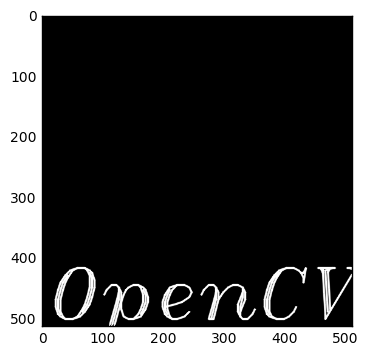

In [140]:
img = np.zeros((512,512,3), np.uint8) 
font = 4 + 16                                                          # FONT_HERSHEY_TRIPLEX + FONT_ITALIC
cv2.putText(img,'OpenCV',(10,500), font, 4,(255,255,255),2,cv2.LINE_AA)
_ = plt.imshow(img[:,:,::-1]), plt.show() 

## Basic Operations 
### Accessing Value and Properties
We can easily access and modify pixel values and image properties.

In [141]:
img = cv2.imread('Images\\flower.jpg')[::2,::2,:]
print('Original pixel intensity [100,100] : {}'.format(img[100,100]))      # Getting intensity values is as simple as accessing 
                                                                           # values of NumPy array
img[100,100] = [255,255,255]
print('Modified pixel intensity [100,100] : {}'.format(img[100,100]))      # Getting the modified values

Original pixel intensity [100,100] : [ 18   0 129]
Modified pixel intensity [100,100] : [255 255 255]


Numpy is a optimized library for fast array calculations. So simply accessing each and every pixel values and modifying it will be very slow and it is discouraged. Numpy array methods, array.item() and array.itemset() is considered to be better. 

In [142]:
print('Red pixel intensity at [10,10]                 : {}'.format(img.item(10,10,2)))
img.itemset((10,10,2),101)
print('After modifying Red pixel intensity at [10,10] : {}'.format(img.item(10,10,2)))

Red pixel intensity at [10,10]                 : 20
After modifying Red pixel intensity at [10,10] : 101


We can also access different image properties like shpae, size, type etc with ease. These properties often help us figure out some of the important properties of an image. Observe the following line of code -

In [143]:
print('Image Shape     : {}'.format(img.shape))           # Shape of an image is returned 
print('Image Size      : {}'.format(img.size))            # Size of the array Rows X Column X Number of color channels 
print('Image Data Type : {}'.format(img.dtype))           # Data type of image

Image Shape     : (426L, 720L, 3L)
Image Size      : 920160
Image Data Type : uint8


### Image ROI & Splitting and Merging Image Channels
Sometimes we are only interest only in certain part of an image like faces, vehicles, Number Plate, Barcode etc., we can extract these part of an image using slicing operation. Observe the following example -    

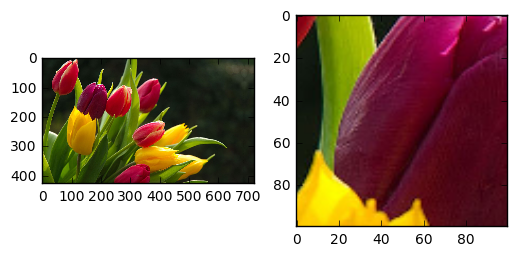

In [145]:
subImage = img[100:200,100:200]
plt.subplot(121),plt.imshow(img[:,:,::-1])
plt.subplot(122),plt.imshow(subImage[:,:,::-1])
plt.show()

Merging and splitting of the color channels is also very simple in opencv. The operation is a costly operation (in terms of time). So do it only if you need it. Otherwise go for Numpy indexing. Let check out this-

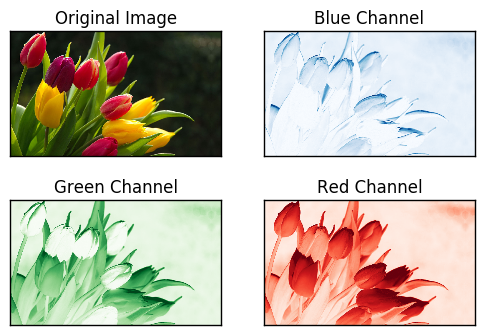

In [146]:
b,g,r = cv2.split(img)                                # splitting color channels into b, g, r
img = cv2.merge((b,g,r))                              # merging back the color channels to get the original image
                                     # OR
b = img[:,:,0]                                        # Its more efficent

_ = plt.subplot(221), plt.title('Original Image'), plt.imshow(img[:,:,::-1]), plt.xticks([]), plt.yticks([])
_ = plt.subplot(222), plt.title('Blue Channel'), plt.imshow(b,cmap='Blues'), plt.xticks([]), plt.yticks([])
_ = plt.subplot(223), plt.title('Green Channel'), plt.imshow(g, cmap='Greens'), plt.xticks([]), plt.yticks([])
_ = plt.subplot(224), plt.title('Red Channel'), plt.imshow(r, cmap='Reds'), plt.xticks([]), plt.yticks([]), plt.show() 

### Making Borders for Images (Padding)
If you want to create a border around the image, something like a photo frame, you can use cv2.copyMakeBorder() function. But it has more applications for convolution operation, zero padding etc. This function takes following arguments:

* src - input image

* top, bottom, left, right - border width in number of pixels in corresponding directions

* borderType - Flag defining what kind of border to be added. It can be following types:
 * cv2.BORDER_CONSTANT - Adds a constant colored border. The value should be given as next argument.
 * cv2.BORDER_REFLECT - Border will be mirror reflection of the border elements, like this : fedcba|abcdefgh|hgfedcb
 * cv2.BORDER_REFLECT_101 or cv2.BORDER_DEFAULT - Same as above, but with a slight change, like this : gfedcb|abcdefgh|gfedcba
 * cv2.BORDER_REPLICATE - Last element is replicated throughout, like this: aaaaaa|abcdefgh|hhhhhhh
 * cv2.BORDER_WRAP - Can’t explain, it will look like this : cdefgh|abcdefgh|abcdefg
* value - Color of border if border type is cv2.BORDER_CONSTANT

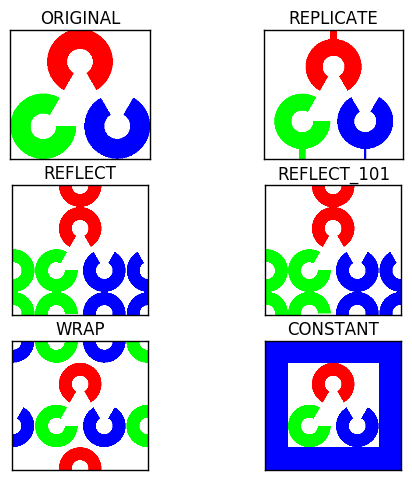

In [148]:
BLUE = [255,0,0]

img1 = cv2.imread('Images/opencv-logo.png')[::2,::2]

replicate = cv2.copyMakeBorder(img1,25,25,25,25,cv2.BORDER_REPLICATE)
reflect = cv2.copyMakeBorder(img1,75,75,75,75,cv2.BORDER_REFLECT)
reflect101 = cv2.copyMakeBorder(img1,75,75,75,75,cv2.BORDER_REFLECT_101)
wrap = cv2.copyMakeBorder(img1,75,75,75,75,cv2.BORDER_WRAP)
constant= cv2.copyMakeBorder(img1,75,75,75,75,cv2.BORDER_CONSTANT,value=BLUE)

plt.subplot(321),plt.imshow(img1[:,:,::-1],'gray'),plt.title('ORIGINAL'),plt.xticks([]), plt.yticks([])
plt.subplot(322),plt.imshow(replicate[:,:,::-1],'gray'),plt.title('REPLICATE'), plt.xticks([]), plt.yticks([])
plt.subplot(323),plt.imshow(reflect[:,:,::-1],'gray'),plt.title('REFLECT'), plt.xticks([]), plt.yticks([])
plt.subplot(324),plt.imshow(reflect101[:,:,::-1],'gray'),plt.title('REFLECT_101'), plt.xticks([]), plt.yticks([])
plt.subplot(325),plt.imshow(wrap[:,:,::-1],'gray'),plt.title('WRAP'), plt.xticks([]), plt.yticks([])
plt.subplot(326),plt.imshow(constant[:,:,::-1],'gray'),plt.title('CONSTANT'), plt.xticks([]), plt.yticks([])
plt.subplots_adjust(left=0.125, bottom=0.1 , right=0.9, top=1.2, wspace=0.2, hspace=0.2)

plt.show()

## Changing Color-space
There are more than 150 [color-space](https://youtu.be/LFXN9PiOGtY) conversion methods available in OpenCV. But we will look into only two which are most widely used ones, BGR$\leftrightarrow$Gray and BGR$\leftrightarrow$HSV. Use this [link](http://colorizer.org/) to quickly see how the different colorspace conversion take place. Lets quickly go through a quick example to get the of, how to change colorspaces and one quick application of it. For object tracking look for dominant color in the object. Then convert that value to hsv and take [H-10,100,100] and [H+10,255,255] as lower and upper limit for color. 

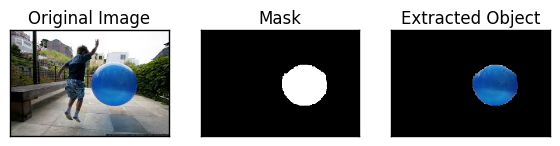

In [149]:
img = cv2.imread('Images\\images.jpg')          
hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)                # Changing Image colorspace from BGR -> HSV
lower_orange = np.array([95,100,100])                    # lower limit for tracking color
upper_orange = np.array([115,255,255])                   # upper limit for tracking color
mask = cv2.inRange(hsv, lower_orange, upper_orange)      # Preparaing mask

# Different morphological transformations for removing noise from data
# We will look into these operations in details later on
kernel = np.ones((3,3),np.uint8)                                        # Declaring kernel for operations
mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel,iterations=2)      # Opening morphological operation
res = cv2.bitwise_and(img[:,:,::-1],img[:,:,::-1], mask = mask)         # And operation done on image

# Displying different stages of operation 
_ = plt.subplot(131),plt.imshow(img[:,:,::-1]),plt.title('Original Image'),plt.xticks([]),plt.yticks([])
_ = plt.subplot(132),plt.imshow(mask,cmap='binary_r'),plt.title('Mask'),plt.xticks([]),plt.yticks([])
_ = plt.subplot(133),plt.imshow(res),plt.title('Extracted Object'),plt.xticks([]),plt.yticks([])
plt.subplots_adjust(left=0.0, bottom=0.4 , right=0.9, top=4, wspace=0.2, hspace=0.7)
plt.show()

## Geometric Transformations of Images
OpenCV provides two transformation functions, cv2.warpAffine and cv2.warpPerspective, with which you can have all kinds of transformations. cv2.warpAffine takes a 2x3 transformation matrix while cv2.warpPerspective takes a 3x3 transformation matrix as input.
### Scaling
Scaling is just resizing of the image. The size of the image can be specified manually, or you can specify the scaling factor. Different [interpolation](https://youtu.be/AqscP7rc8_M) methods are used. Preferable interpolation methods are cv2.INTER_AREA for shrinking and [cv2.INTER_CUBIC](https://youtu.be/poY_nGzEEWM) (slow) & cv2.INTER_LINEAR for zooming. By default, interpolation method used is cv2.INTER_LINEAR for all resizing purposes. 

Size of original image : (852L, 1440L, 3L)
Size of resized image  : (426L, 720L, 3L)


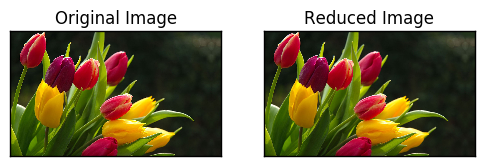

In [150]:
img = cv2.imread('Images\\flower.jpg')
res = cv2.resize(img,None,fx=0.5, fy=0.5, interpolation = cv2.INTER_CUBIC)  

print('Size of original image : {}'.format(img.shape))
print('Size of resized image  : {}'.format(res.shape))
_ = plt.subplot(121),plt.imshow(img[:,:,::-1]),plt.title('Original Image'),plt.xticks([]),plt.yticks([])
_ = plt.subplot(122),plt.imshow(res[:,:,::-1]),plt.title('Reduced Image'),plt.xticks([]),plt.yticks([])
plt.show()

### Translation
Translation is the shifting of object’s location. If you want to understand how Transformations work go through [link1](https://youtu.be/AyW4Y8APjK4) and [link2](https://youtu.be/2Snoepcmi9U). If you know the shift in (x,y) direction, let it be ($t_x$,$t_y$), you can create the transformation matrix **M** as follows:
$$
M = 
\begin{bmatrix}
        1 & 0 & t_x \\
        0 & 1 & t_y \\
\end{bmatrix}
$$

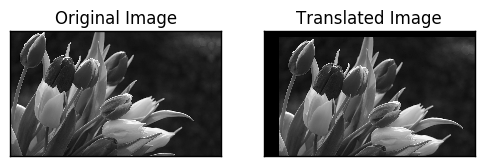

In [151]:
img = cv2.imread('Images\\flower.jpg',0)
rows,cols = img.shape

M = np.float32([[1,0,100],[0,1,50]])                  # 100-tx      &     50-ty
dst = cv2.warpAffine(img,M,(cols,rows))               # note that the thrird argument is (col,row) not (row,col) as offset in 
                                                      # x-axis is colmn and offset in y-axis is rows
_ = plt.subplot(121),plt.imshow(img,cmap='gray'),plt.title('Original Image'),plt.xticks([]),plt.yticks([])
_ = plt.subplot(122),plt.imshow(dst,cmap='gray'),plt.title('Translated Image'),plt.xticks([]),plt.yticks([])
plt.show()

### Rotation
Rotation of an image for an angle $\theta$ is achieved by a transformation matrix. To find this transformation matrix, OpenCV provides a function, **cv2.getRotationMatrix2D**. The different parameters of this function is decribed as follows-
* Point of rotation
* Angle of rotation
* Scaling factor

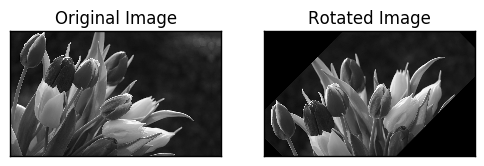

In [152]:
img = cv2.imread('Images\\flower.jpg',0)
rows,cols = img.shape
M = cv2.getRotationMatrix2D((cols/2,rows/2),45,1)           # M - Transformation matrix
dst = cv2.warpAffine(img,M,(cols,rows))
_ = plt.subplot(121),plt.imshow(img,cmap='gray'),plt.title('Original Image'),plt.xticks([]),plt.yticks([])
_ = plt.subplot(122),plt.imshow(dst,cmap='gray'),plt.title('Rotated Image'),plt.xticks([]),plt.yticks([])
plt.show()

### Affine Transformation
In affine transformation, all parallel lines in the original image will still be parallel in the output image. To find the transformation matrix, we need three points from input image and their corresponding locations in output image. Then cv2.getAffineTransform will create a 2x3 matrix which is to be passed to cv2.warpAffine.

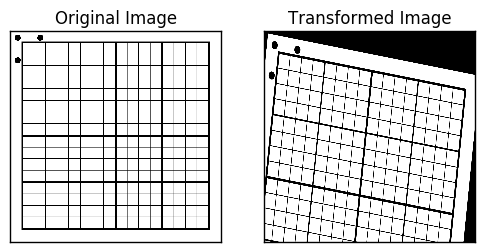

In [153]:
img = cv2.imread('Images\\grid.png',0)
rows,cols = img.shape
#M = cv2.getRotationMatrix2D((cols/2,rows/2),45,1)           

# Plotting the three points which we are going to use for transformation 
cv2.circle(img,(50,50), 20, (0,0,255), -1)  
cv2.circle(img,(200,50), 20, (0,0,255), -1) 
cv2.circle(img,(50,200), 20, (0,0,255), -1) 

# List of the three point and their location in the transformed image
pts1 = np.float32([[50,50],[200,50],[50,200]])
pts2 = np.float32([[70,100],[220,130],[50,300]])

M = cv2.getAffineTransform(pts1,pts2)                         # Calculating Transformation matrix

dst = cv2.warpAffine(img,M,(cols,rows))                       # Applying transformation 
_ = plt.subplot(121),plt.imshow(img,cmap='gray'),plt.title('Original Image'),plt.xticks([]),plt.yticks([])
_ = plt.subplot(122),plt.imshow(dst,cmap='gray'),plt.title('Transformed Image'),plt.xticks([]),plt.yticks([])
plt.show()

## Perspective Transformation
For perspective transformation, you need a 3x3 transformation matrix. Straight lines will remain straight even after the transformation. To find this transformation matrix, you need 4 points on the input image and corresponding points on the output image. Among these 4 points, 3 of them should not be collinear. Then transformation matrix can be found by the function **cv2.getPerspectiveTransform**. Then apply **cv2.warpPerspective** with this 3x3 transformation matrix. We will try to transform the sample images so that the top face of the cube is clearly visible to us in the transformed image.

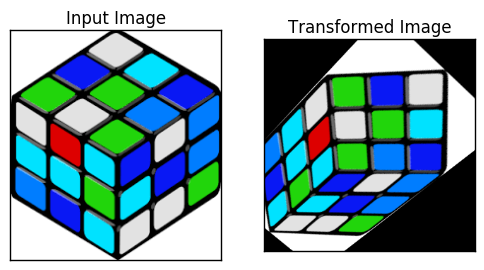

In [154]:
img = cv2.imread('Images\\cube.png')
rows,cols,ch = img.shape

# List of the top face corner coordinates and thier location after transformation 
pts1 = np.float32([[5,60],[105,130],[210,60],[105,0]])
pts2 = np.float32([[100,45],[100,185],[255,185],[255,45]])

M = cv2.getPerspectiveTransform(pts1,pts2)                  # Calculating Transformation matrix

dst = cv2.warpPerspective(img,M,(300,300))                  # Getting output image

plt.subplot(121),plt.imshow(img),plt.title('Input Image'),plt.xticks([]),plt.yticks([])
plt.subplot(122),plt.imshow(dst),plt.title('Transformed Image'),plt.xticks([]),plt.yticks([])
plt.show()

## Image Thresholding
### Simple Thresholding
If pixel value is greater than a threshold value, it is assigned one value (may be white), else it is assigned another value (may be black). The operation is frequently used in creating mask, extracting object etc. The function used is cv2.threshold.
* First argument is the source image, which should be a grayscale image. 
* Second argument is the threshold value which is used to classify the pixel values. 
* Third argument is the maxVal which represents the value to be given if pixel value is more than (sometimes less than) the threshold value.   

OpenCV provides different styles of thresholding and it is decided by the fourth parameter of the function. Different types are:
* cv2.THRESH_BINARY
* cv2.THRESH_BINARY_INV
* cv2.THRESH_TRUNC
* cv2.THRESH_TOZERO
* cv2.THRESH_TOZERO_INV

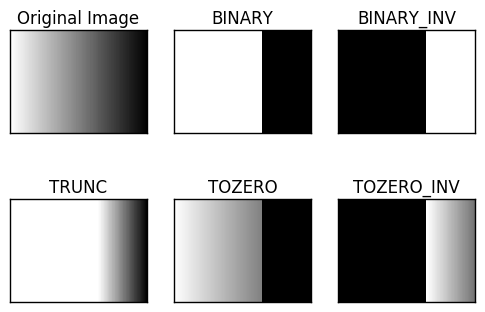

In [155]:
img = cv2.imread('Images\\gradient.jpg',0)
ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)          # right now we dont care about the ret value
ret,thresh2 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)      # as it is same as the threshold value(i.e. 127)
ret,thresh3 = cv2.threshold(img,127,255,cv2.THRESH_TRUNC)           
ret,thresh4 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

for i in xrange(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])

plt.show()

### Adaptive Thresholding
In the previous section, we used a global value as threshold value. But it may not be good in all the conditions where image has different lighting conditions in different areas. In that case, we go for adaptive thresholding. In this, the algorithm calculate the threshold for a small regions of the image. So we get different thresholds for different regions of the same image and it gives us better results for images with varying illumination.

It has three ‘special’ input params and only one output argument.

1. Adaptive Method - It decides how thresholding value is calculated.
  * **cv2.ADAPTIVE_THRESH_MEAN_C** : threshold value is the mean of neighbourhood area.
  * **cv2.ADAPTIVE_THRESH_GAUSSIAN_C** : threshold value is the weighted sum of neighbourhood values where weights are a gaussian window.
2. Block Size - It decides the size of neighbourhood area.
3. C - It is just a constant which is subtracted from the mean or weighted mean calculated.

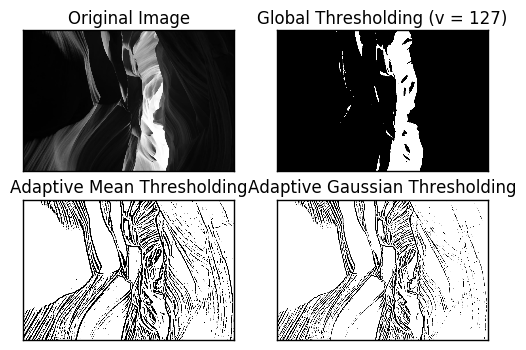

In [157]:
img = cv2.imread('Images\\thresholding.jpg',0)
img = cv2.medianBlur(img,5)                                 # Image smoothening operation

# Global thresholding, Adaptive mean thresholding, Adaptive gaussian thresholding 
ret,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2)
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)

titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]

for i in xrange(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

### Otsu’s Binarization
In the earlier section, I told you that we dont care about ret value, but now we will see its usage. Its use comes when we go for Otsu’s Binarization. So what is it?

In global thresholding, we used an arbitrary value for threshold value, right? So, how can we know a value we selected is good or not? Answer is, trial and error method. But consider a bimodal image (In simple words, bimodal image is an image whose histogram has two peaks). For that image, we can approximately take a value in the middle of those peaks as threshold value, right ? That is what Otsu binarization does. So in simple words, it automatically calculates a threshold value from image histogram for a bimodal image. (For images which are not bimodal, binarization won’t be accurate.)

For this, our cv2.threshold() function is used, but pass an extra flag, cv2.THRESH_OTSU. For threshold value, simply pass zero. Then the algorithm finds the optimal threshold value and returns you as the second output, retVal. If Otsu thresholding is not used, retVal is same as the threshold value you used.

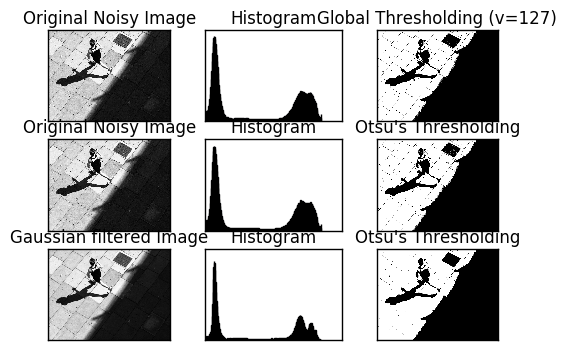

In [158]:
img = cv2.imread('Images/runner.jpg',0)

# global thresholding
ret1,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)

# Otsu's thresholding
ret2,th2 = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# Otsu's thresholding after Gaussian filtering
blur = cv2.GaussianBlur(img,(5,5),0)
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# plot all the images and their histograms
images = [img, 0, th1,
          img, 0, th2,
          blur, 0, th3]
titles = ['Original Noisy Image','Histogram','Global Thresholding (v=127)',
          'Original Noisy Image','Histogram',"Otsu's Thresholding",
          'Gaussian filtered Image','Histogram',"Otsu's Thresholding"]

for i in xrange(3):
    plt.subplot(3,3,i*3+1),plt.imshow(images[i*3],'gray')
    plt.title(titles[i*3]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+2),plt.hist(images[i*3].ravel(),256)
    plt.title(titles[i*3+1]), plt.xticks([]), plt.yticks([])
    plt.subplot(3,3,i*3+3),plt.imshow(images[i*3+2],'gray')
    plt.title(titles[i*3+2]), plt.xticks([]), plt.yticks([])
plt.show()

## Smoothing Images
### 2D Convolution ( Image Filtering )
As in one-dimensional signals, images also can be filtered with various low-pass filters(LPF), high-pass filters(HPF) etc. LPF helps in removing noises, blurring the images etc. HPF filters helps in finding edges in the images.

OpenCV provides a function **cv2.filter2D()** to convolve a kernel with an image. As an example, we will try an averaging filter on an image. A 5x5 averaging filter kernel will look like below:

$$K =  \frac{1}{25} \begin{bmatrix} 1 & 1 & 1 & 1 & 1  \\ 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \end{bmatrix}$$

Operation is like this: keep this kernel above a pixel, add all the 25 pixels below this kernel, take its average and replace the central pixel with the new average value. It continues this operation for all the pixels in the image. Second argument here is the number of color channel in the output image. Check the following code out-

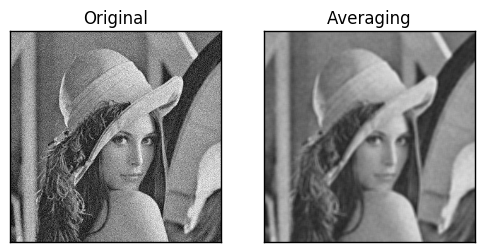

In [159]:
img = cv2.imread('Images/lena.jpg')

kernel = np.ones((5,5),np.float32)/25       # Manually definiing the kernel
dst = cv2.filter2D(img,-1,kernel)           # -1 denotes that color channels should be same as that of input image

plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.show()

### Image Blurring (Image Smoothing)
Image blurring is achieved by convolving the image with a low-pass filter kernel. It is useful for removing noises. It actually removes high frequency content (eg: noise, edges) from the image. So edges are blurred a little bit in this operation.
####  Averaging
This is done by convolving image with a normalized box filter. It simply takes the average of all the pixels under kernel area and replace the central element. This is done by the function **cv2.blur()** or **cv2.boxFilter()**.
$$K =  \frac{1}{9} \begin{bmatrix} 1 & 1 & 1  \\ 1 & 1 & 1 \\ 1 & 1 & 1 \end{bmatrix}$$

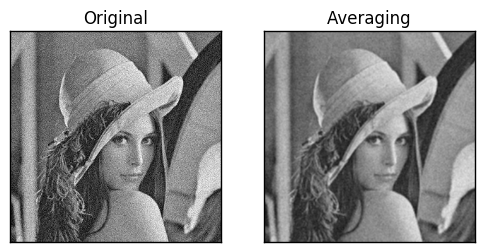

In [160]:
img = cv2.imread('Images/lena.jpg')

blur = cv2.blur(img,(3,3))                          # the kernel should be square with odd dimention like 3,5,7...
                                                    # here we have used a 3 X 3 kernel
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(blur),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.show()

#### Gaussian Blurring
This is done with the function, **cv2.GaussianBlur()**. We should specify the width and height of kernel which should be positive and odd. We also should specify the standard deviation in X and Y direction, sigmaX and sigmaY respectively. If only sigmaX is specified, sigmaY is taken as same as sigmaX. If both are given as zeros, they are calculated from kernel size. Gaussian blurring is highly effective in removing gaussian noise from the image. This [link](https://youtu.be/C_zFhWdM4ic) will provide an easy explanation on how gaussian blur works. Check how it is performed-

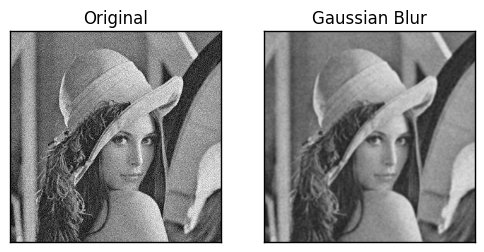

In [161]:
img = cv2.imread('Images/lena.jpg')

blur = cv2.GaussianBlur(img,(5,5),0)            # 0 indicates that the standard deviation is calculated from kernel

plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(blur),plt.title('Gaussian Blur')
plt.xticks([]), plt.yticks([])
plt.show()

#### Median Blurring
Here, the function **cv2.medianBlur()** takes median of all the pixels under kernel area and central element is replaced with this median value. This is highly effective against salt-and-pepper noise in the images. Interesting thing is that, in the above filters, central element is a newly calculated value which may be a pixel value in the image or a new value. But in median blurring, central element is always replaced by some pixel value in the image. It reduces the noise effectively.

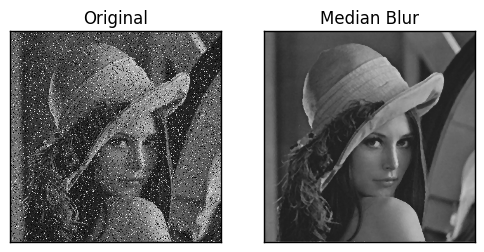

In [162]:
img = cv2.imread('Images/saltandpepper.png')

median = cv2.medianBlur(img,5)      

plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(median),plt.title('Median Blur')
plt.xticks([]), plt.yticks([])
plt.show()

## Morphological Transformations
Morphological transformations are some simple operations based on the image shape. It is normally performed on binary images. It needs two inputs, one is our original image, second one is called structuring element or kernel which decides the nature of operation. Two basic morphological operators are Erosion and Dilation. Then its variant forms like Opening, Closing, Gradient etc also comes into play. 
### Erosion
he basic idea of erosion is just like soil erosion only, it erodes away the boundaries of foreground object (Always try to keep foreground in white). So what it does? The kernel slides through the image (as in 2D convolution). A pixel in the original image (either 1 or 0) will be considered 1 only if all the pixels under the kernel is 1, otherwise it is eroded (made to zero).

So what happends is that, all the pixels near boundary will be discarded depending upon the size of kernel. So the thickness or size of the foreground object decreases or simply white region decreases in the image. It is useful for removing small white noises (as we have seen in colorspace chapter), detach two connected objects etc.

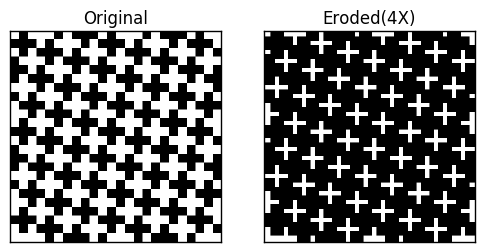

In [163]:
img = cv2.imread('Images/bin.png',0)
kernel = np.ones((5,5),np.uint8)                       # 5X5 kernel creation
erosion = cv2.erode(img,kernel,iterations = 4)         # 4 iterations of erosion operation

plt.subplot(121),plt.imshow(img,cmap='binary_r'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(erosion,cmap='binary_r'),plt.title('Eroded(4X)')
plt.xticks([]), plt.yticks([])
plt.show()

### Dilation
It is just opposite of erosion. Here, a pixel element is ‘1’ if atleast one pixel under the kernel is ‘1’. So it increases the white region in the image or size of foreground object increases. Normally, in cases like noise removal, erosion is followed by dilation. Because, erosion removes white noises, but it also shrinks our object. So we dilate it. Since noise is gone, they won’t come back, but our object area increases. It is also useful in joining broken parts of an object.

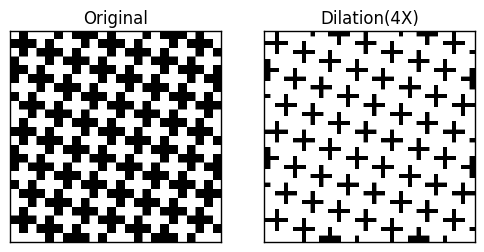

In [164]:
img = cv2.imread('Images/bin.png',0)
kernel = np.ones((5,5),np.uint8)                       # 5X5 kernel creation
dilation = cv2.dilate(img,kernel,iterations = 4)       # 4 iterations of dilation operation

plt.subplot(121),plt.imshow(img,cmap='binary_r'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dilation,cmap='binary_r'),plt.title('Dilation(4X)')
plt.xticks([]), plt.yticks([])
plt.show()

### Opening
Opening is just another name of erosion followed by dilation. It is useful in removing noise, as we explained above. Here we use the function, **cv2.morphologyEx()**.

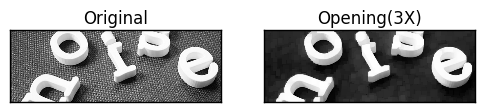

In [165]:
img = cv2.imread('Images/open.png',0)
kernel = np.ones((5,5),np.uint8)                                           # 5X5 kernel creation
opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel,iterations=3)       # 3 iterations of opening operation

plt.subplot(121),plt.imshow(img,cmap='binary_r'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(opening,cmap='binary_r'),plt.title('Opening(3X)')
plt.xticks([]), plt.yticks([])
plt.show()

### Closing
Closing is reverse of Opening, Dilation followed by Erosion. It is useful in closing small holes inside the foreground objects, or small black points on the object.

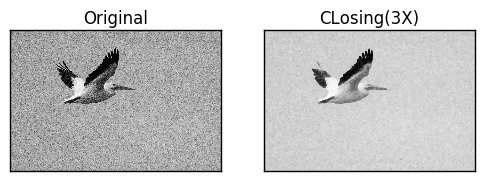

In [166]:
img = cv2.imread('Images/close.jpg',0)
kernel = np.ones((5,5),np.uint8)                                           # 5X5 kernel creation
closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel,iterations=3)       # 3 iterations of opening operation

plt.subplot(121),plt.imshow(img,cmap='binary_r'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(closing,cmap='binary_r'),plt.title('CLosing(3X)')
plt.xticks([]), plt.yticks([])
plt.show()

### Morphological Gradient
It is really just the difference between dilation and erosion of an image.

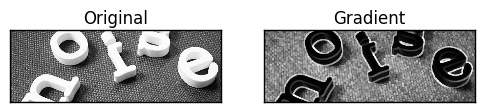

In [167]:
img = cv2.imread('Images/open.png',0)
kernel = np.ones((5,5),np.uint8)                                           # 5X5 kernel creation
gradient = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)       # 3 iterations of opening operation

plt.subplot(121),plt.imshow(img,cmap='binary_r'),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(gradient,cmap='binary_r'),plt.title('Gradient')
plt.xticks([]), plt.yticks([])
plt.show()

### Structuring Element
We manually created a structuring elements in the previous examples with help of Numpy. It is rectangular shape. But in some cases, you may need elliptical/circular shaped kernels. So for this purpose, OpenCV has a function, **cv2.getStructuringElement()**. You just pass the shape and size of the kernel, you get the desired kernel.

In [168]:
rect = cv2.getStructuringElement(cv2.MORPH_RECT,(5,5))                 # Rectangular Kernel
ellipse = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))           # Elliptical Kernel
cross = cv2.getStructuringElement(cv2.MORPH_CROSS,(5,5))               # Cross-shaped Kernel

print('Rectangular Kernel : \n{}'.format(rect))
print('\nElliptical Kernel  : \n{}'.format(ellipse))
print('\nCross Kernel       : \n{}'.format(cross))

Rectangular Kernel : 
[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]

Elliptical Kernel  : 
[[0 0 1 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [0 0 1 0 0]]

Cross Kernel       : 
[[0 0 1 0 0]
 [0 0 1 0 0]
 [1 1 1 1 1]
 [0 0 1 0 0]
 [0 0 1 0 0]]


## Image Gradients
### Sobel and Scharr Derivatives
[Sobel](https://youtu.be/uihBwtPIBxM) operators is a joint Gausssian smoothing plus differentiation operation, so it is more resistant to noise. You can specify the direction of derivatives to be taken, vertical or horizontal (by the arguments, **yorder**(forth argument) and **xorder**(third argument) respectively). You can also specify the size of kernel by the argument ksize. If ksize = -1, a 3x3 Scharr filter is used which gives better results than 3x3 Sobel filter.
We calculate two derivatives:

* Horizontal changes: This is computed by convolving I with a kernel $G_{x}$ with odd size. For example for a kernel size of 3, $G_{x}$ would be computed as:

$$
G_{x} = \begin{bmatrix}
-1 & 0 & +1  \\
-2 & 0 & +2  \\
-1 & 0 & +1
\end{bmatrix} * I
$$

* Vertical changes: This is computed by convolving I with a kernel $G_{y}$ with odd size. For example for a kernel size of 3, $G_{y}$ would be computed as:

$$
G_{y} = \begin{bmatrix}
-1 & -2 & -1  \\
0 & 0 & 0  \\
+1 & +2 & +1
\end{bmatrix} * I
$$

* At each point of the image we calculate an approximation of the gradient in that point by combining both results above:

$$
G = \sqrt{ G_{x}^{2} + G_{y}^{2} }$$

When the size of the kernel is 3, the Sobel kernel shown above may produce noticeable inaccuracies (after all, Sobel is only an approximation of the derivative). OpenCV addresses this inaccuracy for kernels of size 3 by using the Scharr function. This is as fast but more accurate than the standar Sobel function. It implements the following kernels:
$$
G_{x} = \begin{bmatrix}
-3 & 0 & +3  \\
-10 & 0 & +10  \\
-3 & 0 & +3
\end{bmatrix}
$$

$$
G_{y} = \begin{bmatrix}
-3 & -10 & -3  \\
0 & 0 & 0  \\
+3 & +10 & +3
\end{bmatrix}
$$

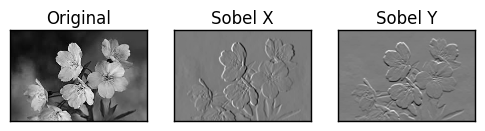

In [169]:
img = cv2.imread('Images/flow.jpg',0)

sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)                # Finds out all the vertical edges   
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)                # Finds out all the horizontal edges

plt.subplot(1,3,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,2),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,3),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])

plt.show()

### Laplacian Derivatives
It calculates the Laplacian of the image given by the relation, $\Delta src = \frac{\partial ^2{src}}{\partial x^2} + \frac{\partial ^2{src}}{\partial y^2}$ where each derivative is found using Sobel derivatives. If ksize = 1, then following kernel is used for filtering:

$$kernel = \begin{bmatrix} 0 & 1 & 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0  \end{bmatrix}$$

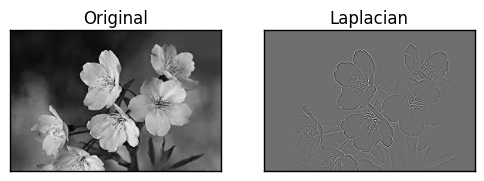

In [170]:
img = cv2.imread('Images/flow.jpg',0)

laplacian = cv2.Laplacian(img,cv2.CV_64F)

plt.subplot(1,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.show()

## Canny Edge Detection
Canny Edge Detection is a popular edge detection algorithm. It was developed by John F. Canny in 1986. It is a multi-stage algorithm and we will go through each stages.

* **_Noise Reduction_**  
Since edge detection is susceptible to noise in the image, first step is to remove the noise in the image with a 5x5 Gaussian filter. We have already seen this in previous chapters.

* **_Finding Intensity Gradient of the Image_**  
Smoothened image is then filtered with a Sobel kernel in both horizontal and vertical direction to get first derivative in horizontal direction (G_x) and vertical direction (G_y). From these two images, we can find edge gradient and direction for each pixel as follows:

$$Edge\_Gradient \; (G) = \sqrt{G_x^2 + G_y^2}$$

$$Angle \; (\theta) = \tan^{-1} \bigg(\frac{G_y}{G_x}\bigg)$$

**Gradient direction is always perpendicular to edges**. It is rounded to one of four angles representing vertical, horizontal and two diagonal directions.

* **_Non-maximum Suppression_**  
After getting gradient magnitude and direction, a full scan of image is done to remove any unwanted pixels which may not constitute the edge. For this, at every pixel, pixel is checked if it is a local maximum in its neighborhood in the direction of gradient.

* **_Hysteresis Thresholding_**
This stage decides which are all edges are really edges and which are not. For this, we need two threshold values, minVal and maxVal. Any edges with intensity gradient more than maxVal are sure to be edges and those below minVal are sure to be non-edges, so discarded. Those who lie between these two thresholds are classified edges or non-edges based on their connectivity. If they are connected to “sure-edge” pixels, they are considered to be part of edges. Otherwise, they are also discarded. See the image below:![Hysteresis Thresholding](Images/hysteresis.jpg)

Hysteresis Thresholding
The edge A is above the maxVal, so considered as “sure-edge”. Although edge C is below maxVal, it is connected to edge A, so that also considered as valid edge and we get that full curve. But edge B, although it is above minVal and is in same region as that of edge C, it is not connected to any “sure-edge”, so that is discarded. So it is very important that we have to select minVal and maxVal accordingly to get the correct result.

This stage also removes small pixels noises on the assumption that edges are long lines.


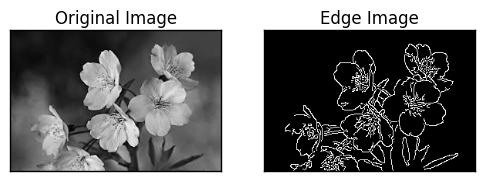

In [171]:
img = cv2.imread('Images/flow.jpg',0)
edges = cv2.Canny(img,100,200)             # 100 - first threshold for the hysteresis procedure.
                                           # 200 - second threshold for the hysteresis procedure.

plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

plt.show()

## Image Pyramids
Normally, we used to work with an image of constant size. But in some occassions, we need to work with images of different resolution of the same image. For example, while searching for something in an image, like face, we are not sure at what size the object will be present in the image. In that case, we will need to create a set of images with different resolution and search for object in all the images. These set of images with different resolution are called [Image Pyramids](https://youtu.be/NiGcuurpV5o) (because when they are kept in a stack with biggest image at bottom and smallest image at top look like a pyramid).  

Remember, higher_reso is not equal to original image, because once you decrease the resolution, you loose the information.


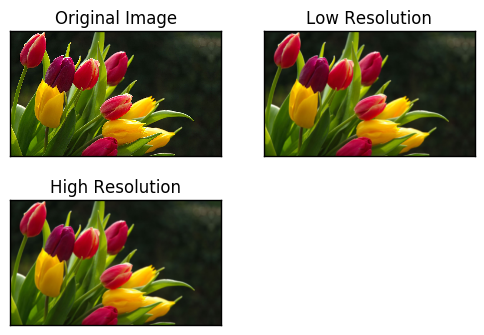

In [172]:
img = cv2.imread('Images/flower.jpg')
lower_reso = cv2.pyrDown(img)
lower_reso2 = cv2.pyrDown(lower_reso)
higher_reso = cv2.pyrUp(lower_reso2)

plt.subplot(221),plt.imshow(img[:,:,::-1])
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(lower_reso2[:,:,::-1])
plt.title('Low Resolution'), plt.xticks([]), plt.yticks([])
plt.subplot(223),plt.imshow(higher_reso[:,:,::-1])
plt.title('High Resolution'), plt.xticks([]), plt.yticks([])
plt.show()

## Hough Line Transform
[Hough Transform](https://www.youtube.com/watch?v=MA1f9FsrCco&index=99&list=PLAwxTw4SYaPnbDacyrK_kB_RUkuxQBlCm) is a popular technique to detect any shape, if you can represent that shape in mathematical form. It can detect the shape even if it is broken or distorted a little bit. **cv2.HoughLines()** simply returns an array of ($\rho$, $\theta$) values. $\rho$ is measured in pixels and $\theta$ is measured in radians. First parameter, Input image should be a binary image, so apply threshold or use canny edge detection before finding applying hough transform. Second and third parameters are \rho and \theta accuracies respectively. Fourth argument is the threshold, which means minimum vote it should get for it to be considered as a line. Remember, number of votes depend upon number of points on the line. So it represents the minimum length of line that should be detected.

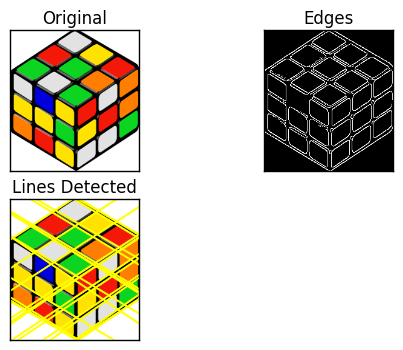

In [173]:
import math                                   # imported math for calculating sin and cos

image1 = cv2.imread('Images/cube.png')
original = np.copy(image1)                    # created a separated copy for comparision
gray=cv2.cvtColor(image1,cv2.COLOR_BGR2GRAY)
dst = cv2.Canny(gray, 50, 200)

lines= cv2.HoughLines(dst, 1, math.pi/180.0, 85)  
a,b,c = lines.shape
for i in range(a):
    rho = lines[i][0][0]
    theta = lines[i][0][1]
    a = math.cos(theta)
    b = math.sin(theta)
    x0, y0 = a*rho, b*rho
    pt1 = ( int(x0+1000*(-b)), int(y0+1000*(a)) )
    pt2 = ( int(x0-1000*(-b)), int(y0-1000*(a)) )
    cv2.line(image1, pt1, pt2, (0, 255, 255), 2, cv2.LINE_AA)


plt.subplot(223),plt.imshow(image1[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Lines Detected')
plt.subplot(221),plt.imshow(original[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Original')
plt.subplot(222),plt.imshow(dst,cmap='gray'),plt.xticks([]),plt.yticks([]),plt.title('Edges')
plt.show()

## Hough Circle Transform
A circle is represented mathematically as $(x-x_{center})^2 + (y - y_{center})^2 = r^2 $ where $ (x_{center},y_{center}) $is the center of the circle, and r is the radius of the circle. From equation, we can see we have 3 parameters, so we need a 3D accumulator for hough transform, which would be highly ineffective. So OpenCV uses more trickier method, Hough Gradient Method which uses the gradient information of edges.

The function we use here is **cv2.HoughCircles()**. It has plenty of arguments which are well explained below-
1. image – Grayscale input image.
2. circles – Output vector of found circles. Each vector is encoded as a 3-element floating-point vector (x, y, radius) .
3. method – Detection method to use. Currently, the only implemented method is CV_HOUGH_GRADIENT , which is basically 21HT , described in [Yuen90].
4. dp – Inverse ratio of the accumulator resolution to the image resolution. For example, if dp=1 , the accumulator has the same resolution as the input image. If dp=2 , the accumulator has half as big width and height.
5. minDist – Minimum distance between the centers of the detected circles. If the parameter is too small, multiple neighbor circles may be falsely detected in addition to a true one. If it is too large, some circles may be missed.
6. param1 – First method-specific parameter. In case of CV_HOUGH_GRADIENT , it is the higher threshold of the two passed to the Canny() edge detector (the lower one is twice smaller).
7. param2 – Second method-specific parameter. In case of CV_HOUGH_GRADIENT , it is the accumulator threshold for the circle centers at the detection stage. The smaller it is, the more false circles may be detected. Circles, corresponding to the larger accumulator values, will be returned first.
8. minRadius – Minimum circle radius.
9. maxRadius – Maximum circle radius.


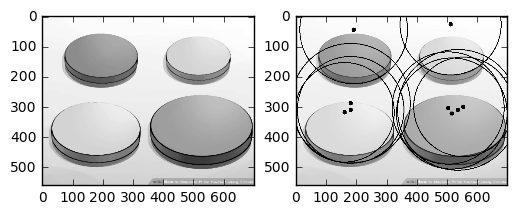

In [174]:
img = cv2.imread('Images/cir.jpg',0)
img = cv2.medianBlur(img,5)
cimg = np.copy(img)

circles = cv2.HoughCircles(img,cv2.HOUGH_GRADIENT,1,20,        # Detecing circles      
                            param1=50,param2=30,minRadius=160,maxRadius=200)

circles = np.uint16(np.around(circles))                        # change type to uint16

for i in circles[0,:]:
    cv2.circle(cimg,(i[0],i[1]),i[2],(0,255,0),2)              # draw the outer circle
    cv2.circle(cimg,(i[0],i[1]),2,(0,0,255),10)                # draw the center of the circle
    
plt.subplot(121),plt.imshow(img,cmap='gray')
plt.subplot(122),plt.imshow(cimg,cmap='gray')
plt.show()

## Image Segmentation with Watershed Algorithm
Any grayscale image can be viewed as a topographic surface where high intensity denotes peaks and hills while low intensity denotes valleys. You start filling every isolated valleys (local minima) with different colored water (labels). As the water rises, depending on the peaks (gradients) nearby, water from different valleys, obviously with different colors will start to merge. To avoid that, you build barriers in the locations where water merges. You continue the work of filling water and building barriers until all the peaks are under water. Then the barriers you created gives you the segmentation result. This is the “philosophy” behind the watershed.

Let us take a minute before directly jumping to the code and understand some of the concepts involved here-  
**Distance Transform:-**  
The distance transform is an operator normally only applied to binary images. The result of the transform is a graylevel image that looks similar to the input image, except that the graylevel intensities of points inside foreground regions are changed to show the distance to the closest boundary from each point.  
![Distance Transform](Images\distance.png)  
**Example:**
<table><tr><td><img src='Images\dist.png' style="width: 240px;"></td><td><img src='Images\transf.png' style="width: 240px;"></td></tr></table>


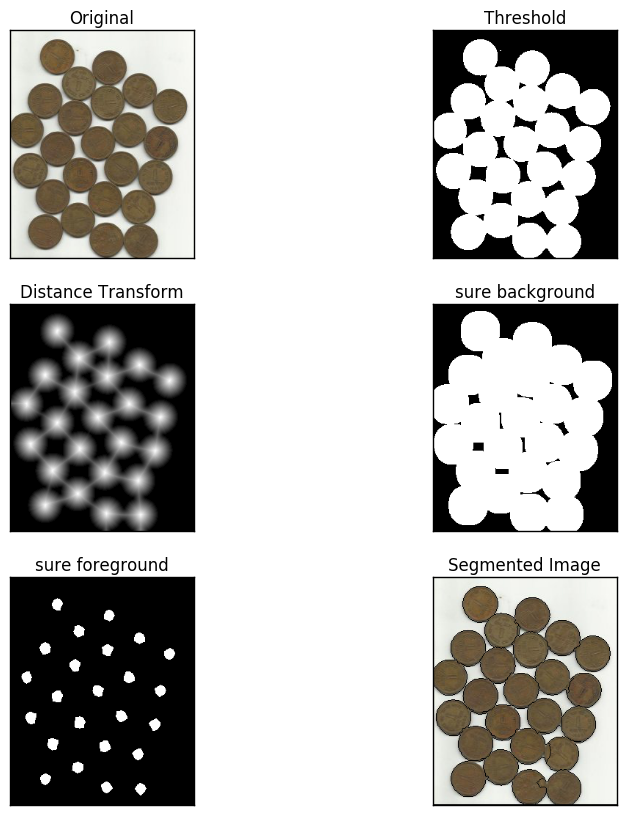

In [175]:
img = cv2.imread('Images\\coin.jpg')
original = np.copy(img)
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

kernel = np.ones((3,3),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 2)            # noise removal

sure_bg = cv2.dilate(opening,kernel,iterations=3)                                   # sure background area

dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)                       # Distance transform
ret, sure_fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)         # Extracting 70% of image

# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)
# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)                              # The funtion is only available in OpenCV 3.x

markers = markers+1                                        # Add one to all labels so that sure background is not 0, but 1

markers[unknown==255] = 0                                                      # Now, mark the region of unknown with zero
markers = cv2.watershed(img,markers)
img[markers == -1] = [0,0,0]

f, ax = plt.subplots(3,2,figsize=(10, 10))
ax[0,0].imshow(original[:,:,::-1]), ax[0,0].set_xticks([]), ax[0,0].set_yticks([]), ax[0,0].set_title('Original')
ax[0,1].imshow(thresh,cmap='binary_r'), ax[0,1].set_xticks([]), ax[0,1].set_yticks([]), ax[0,1].set_title('Threshold')
ax[1,0].imshow(dist_transform,cmap='binary_r'), ax[1,0].set_xticks([]), ax[1,0].set_yticks([]), ax[1,0].set_title('Distance Transform')
ax[1,1].imshow(sure_bg,cmap='binary_r'), ax[1,1].set_xticks([]), ax[1,1].set_yticks([]), ax[1,1].set_title('sure background')
ax[2,0].imshow(sure_fg,cmap='binary_r'), ax[2,0].set_xticks([]), ax[2,0].set_yticks([]), ax[2,0].set_title('sure foreground')
ax[2,1].imshow(img[:,:,::-1]), ax[2,1].set_xticks([]), ax[2,1].set_yticks([]), ax[2,1].set_title('Segmented Image')
plt.show()

## Interactive Foreground Extraction using GrabCut Algorithm
Initially user draws a rectangle around the foreground region (foreground region shoule be completely inside the rectangle). Then algorithm segments it iteratively to get the best result. Done. But in some cases, the segmentation won’t be fine, like, it may have marked some foreground region as background and vice versa. In that case, user need to do fine touch-ups. Just give some strokes on the images where some faulty results are there. Strokes basically says “Hey, this region should be foreground, you marked it background, correct it in next iteration” or its opposite for background. Then in the next iteration, you get better results. The algorithm works like this-  
* User inputs the rectangle. Everything outside this rectangle will be taken as sure background (That is the reason it is mentioned before that your rectangle should include all the objects). Everything inside rectangle is unknown. Similarly any user input specifying foreground and background are considered as hard-labelling which means they won’t change in the process.
* Computer does an initial labelling depeding on the data we gave. It labels the foreground and background pixels (or it hard-labels)
* Now a Gaussian Mixture Model(GMM) is used to model the foreground and background.
* Depending on the data we gave, GMM learns and create new pixel distribution. That is, the unknown pixels are labelled either probable foreground or probable background depending on its relation with the other hard-labelled pixels in terms of color statistics (It is just like clustering).
* A graph is built from this pixel distribution. Nodes in the graphs are pixels. Additional two nodes are added, Source node and Sink node. Every foreground pixel is connected to Source node and every background pixel is connected to Sink node.
* The weights of edges connecting pixels to source node/end node are defined by the probability of a pixel being foreground/background. The weights between the pixels are defined by the edge information or pixel similarity. If there is a large difference in pixel color, the edge between them will get a low weight.
* Then a [mincut algorithm](https://youtu.be/HMGX8HXskKk) is used to segment the graph. It cuts the graph into two separating source node and sink node with minimum cost function. The cost function is the sum of all weights of the edges that are cut. After the cut, all the pixels connected to Source node become foreground and those connected to Sink node become background.
* The process is continued until the classification converges.
![Grabcut Algorithm](Images\grabcut.jpg)

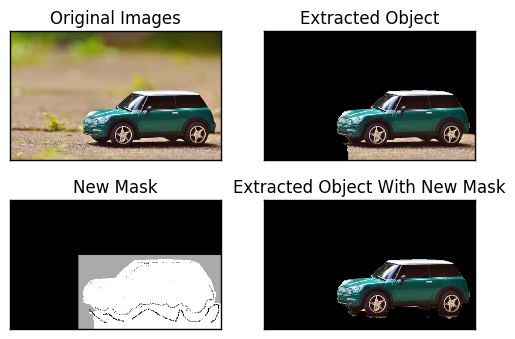

In [176]:
img = cv2.imread('Images\\mini.jpg')
mask = np.zeros(img.shape[:2],np.uint8)                           # Creating a simple mask

plt.subplot(221),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Original Images')

bgdModel = np.zeros((1,65),np.float64)                            # Creaing two arrays which will be used by algorithm internally
fgdModel = np.zeros((1,65),np.float64)

rect = (185,150,565,315)                                                     # Box encapsulating the foreground completely
cv2.grabCut(img,mask,rect,bgdModel,fgdModel,5,cv2.GC_INIT_WITH_RECT)         # 5 - number of iterations
                                                                             # cv2.GC_INIT_WITH_RECT - Extraction using rectangle

mask2 = np.where((mask==2)|(mask==0),0,1).astype('uint8')
img = img*mask2[:,:,np.newaxis]

plt.subplot(222),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Extracted Object')

# newmask is the mask image I manually labelled
newmask = cv2.imread('Images\\mod_mini.jpg',0)                    # Image with foreground and background marked

# whereever it is marked white (sure foreground), change mask=1
# whereever it is marked black (sure background), change mask=0
mask[newmask == 0] = 0
mask[newmask == 255] = 1

plt.subplot(223),plt.imshow(mask,cmap='binary_r'),plt.xticks([]),plt.yticks([]),plt.title('New Mask')

mask, bgdModel, fgdModel = cv2.grabCut(img,mask,None,bgdModel,fgdModel,5,cv2.GC_INIT_WITH_MASK)
                                                                             # cv2.GC_INIT_WITH_MASK - Extraction using mask

mask = np.where((mask==2)|(mask==0),0,1).astype('uint8')
img = img*mask[:,:,np.newaxis]
plt.subplot(224),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Extracted Object With New Mask')
plt.show()


## Histograms
Histogram is a plot, which gives you an overall idea about the intensity distribution of an image. It is a plot with pixel values (ranging from 0 to 255, not always) in X-axis and corresponding number of pixels in the image on Y-axis. For example-

![Histogram of Image](Images\histogram.jpg)

So now we use cv2.calcHist() function to find the histogram. Let’s familiarize with the function and its parameters :

> cv2.calcHist(images, channels, mask, histSize, ranges[, hist[, accumulate]])

1. **images** : it is the source image of type uint8 or float32. it should be given in square brackets, ie, “[img]”.
2. **channels** : it is also given in square brackets. It is the index of channel for which we calculate histogram. For example, if input is grayscale image, its value is [0]. For color image, you can pass [0], [1] or [2] to calculate histogram of blue, green or red channel respectively.
3. **mask** : mask image. To find histogram of full image, it is given as “None”. But if you want to find histogram of particular region of image, you have to create a mask image for that and give it as mask. (I will show an example later.)
4. **histSize** : this represents our BIN count. Need to be given in square brackets. For full scale, we pass [256].
5. **ranges** : this is our RANGE. Normally, it is [0,256].

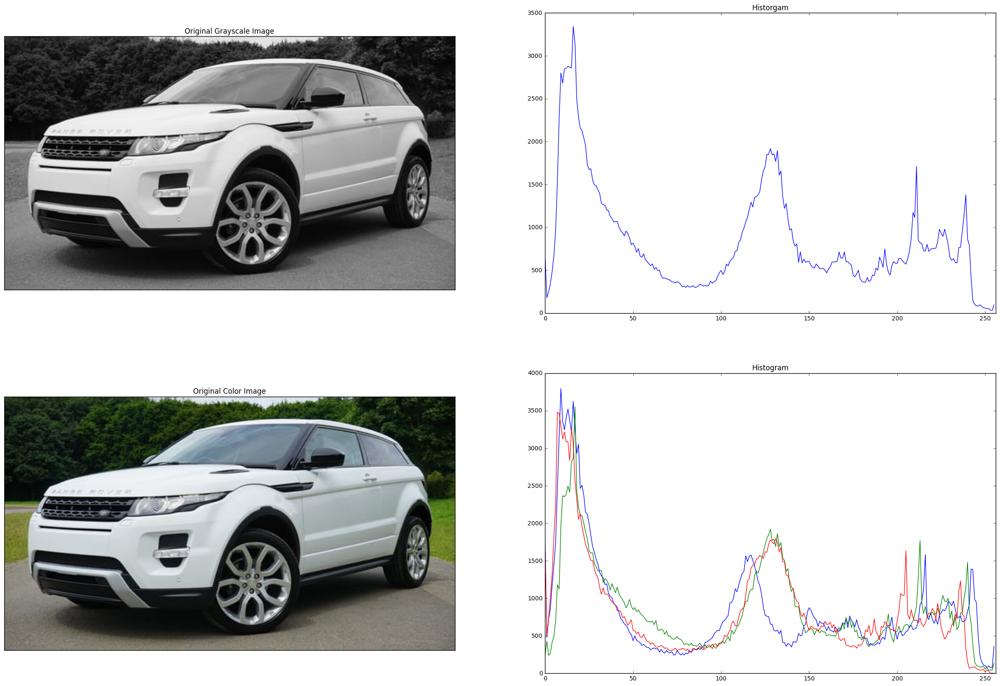

In [178]:
img = cv2.imread('Images\car.jpg',0)                             # Reading image as grayscale
hist = cv2.calcHist([img],[0],None,[256],[0,256])                # calculating histogram

fig, ax = plt.subplots(2,2,figsize=(30,20))
ax[0,0].imshow(img,cmap='gray'),ax[0,0].set_xticks([]),ax[0,0].set_yticks([]),ax[0,0].set_title('Original Grayscale Image')
ax[0,1].plot(hist),ax[0,1].set_title('Historgam'),ax[0,1].axis([0,256,0,3500])

col_img = cv2.imread('Images\car.jpg')
ax[1,0].imshow(col_img[:,:,::-1]),ax[1,0].set_xticks([]),ax[1,0].set_yticks([]),ax[1,0].set_title('Original Color Image')
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([col_img],[i],None,[256],[0,256])
    ax[1,1].plot(histr,color = col)
    ax[1,1].set_xlim([0,256])
ax[1,1].set_title('Histogram')    
plt.show()

### Histogram Equalization
Consider an image whose pixel values are confined to some specific range of values only. For eg, brighter image will have all pixels confined to high values. But a good image will have pixels from all regions of the image. So you need to stretch this histogram to either ends and that is what Histogram Equalization does. This normally improves the contrast of the image.

![Histogram Equalization](Images\equalization.png)

#### CLAHE (Contrast Limited Adaptive Histogram Equalization)
Histogram equalization considers the global contrast of the image. In many cases, it is not a good idea because contrast in images changes dramatically. Sometimes some part of the image are too bright and other parts are too dark. In that case, a lot of information is lost during histogram equalization.

So to solve this problem, adaptive histogram equalization is used. In this, image is divided into small blocks called “tiles” (tileSize is 8x8 by default in OpenCV). Then each of these blocks are histogram equalized as usual. So in a small area, histogram would confine to a small region (unless there is noise). If noise is there, it will be amplified. To avoid this, contrast limiting is applied. If any histogram bin is above the specified contrast limit (by default 40 in OpenCV), those pixels are clipped and distributed uniformly to other bins before applying histogram equalization. After equalization, to remove artifacts in tile borders, bilinear interpolation is applied.

we use **cv2.calcHist()** function to find the histogram. Let's familiarize with the function and its parameters-
* **images** : it is the source image of type uint8 or float32. it should be given in square brackets, ie, "[img]".
* **channels** : it is also given in square brackets. It is the index of channel for which we calculate histogram. For example, if input is grayscale image, its value is [0]. For color image, you can pass [0], [1] or [2] to calculate histogram of blue, green or red channel respectively.
* **mask** : mask image. To find histogram of full image, it is given as "None". But if you want to find histogram of particular region of image, you have to create a mask image for that and give it as mask. (I will show an example later.)
* **histSize** : this represents our BIN count. Need to be given in square brackets. For full scale, we pass [256].
* **ranges** : this is our RANGE. Normally, it is [0,256].

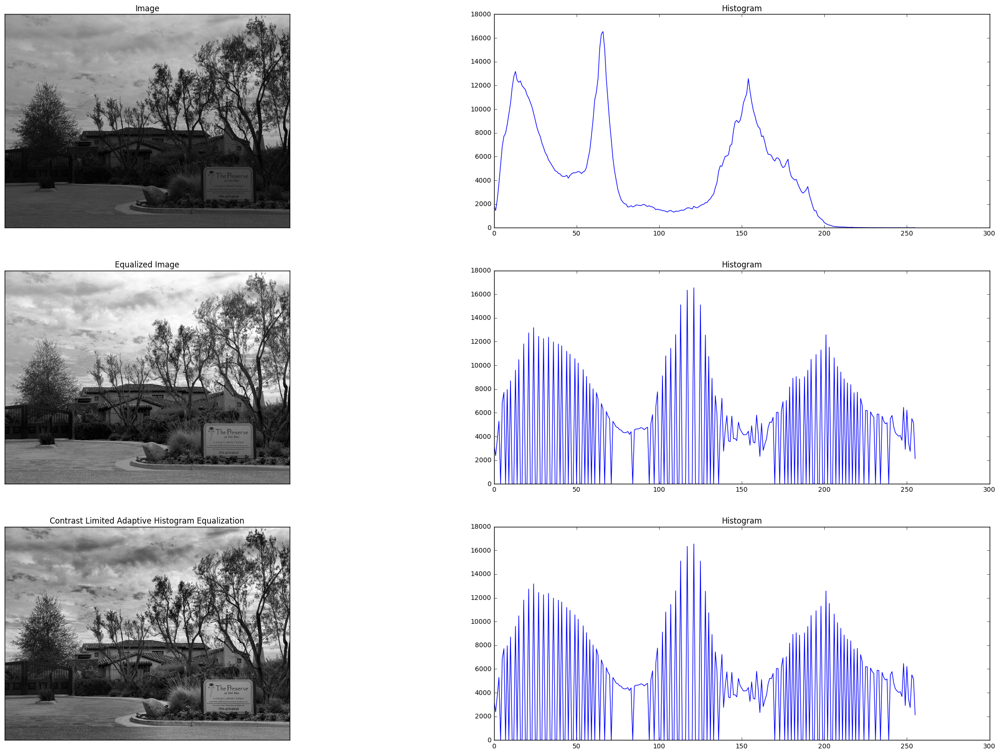

In [179]:
img = cv2.imread('Images\lowexp.jpg',0)                     
img_hist = cv2.calcHist([img],[0],None,[256],[0,256])                # Calculating image histogram

equ = cv2.equalizeHist(img)
equ_hist = cv2.calcHist([equ],[0],None,[256],[0,256])

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))          # Giving parameter for CLAHE
cl1 = clahe.apply(img)                                              # Applying Contrast Limited Adaptive Histogram Equalization 
cl1_hist = cv2.calcHist([equ],[0],None,[256],[0,256])               # Calculating histogram

fig, ax = plt.subplots(3,2,figsize=(30,20))
ax[0,0].imshow(img,cmap='gray'),ax[0,0].set_xticks([]),ax[0,0].set_yticks([]),ax[0,0].set_title('Image')
ax[0,1].plot(img_hist),ax[0,1].set_title('Histogram')
ax[1,0].imshow(equ,cmap='gray'),ax[1,0].set_xticks([]),ax[1,0].set_yticks([]),ax[1,0].set_title('Equalized Image')
ax[1,1].plot(equ_hist),ax[1,1].set_title('Histogram')
ax[2,0].imshow(cl1,cmap='gray'),ax[2,0].set_xticks([]),ax[2,0].set_yticks([])
ax[2,0].set_title('Contrast Limited Adaptive Histogram Equalization')
ax[2,1].plot(cl1_hist),ax[2,1].set_title('Histogram')
plt.show()

## Contours
Contours can be explained simply as a curve joining all the continuous points (along the boundary), having same color or intensity. The contours are a useful tool for shape analysis and object detection and recognition.  
* For better accuracy, use binary images. So before finding contours, apply threshold or canny edge detection.
* findContours function modifies the source image. So if you want source image even after finding contours, already store it to some other variables.
* In OpenCV, finding contours is like finding white object from black background. So remember, object to be found should be white and background should be black.

#### Drawing the contours

To draw the contours, cv2.drawContours function is used. It can also be used to draw any shape provided you have its boundary points. Its first argument is source image, second argument is the contours which should be passed as a Python list, third argument is index of contours (useful when drawing individual contour. To draw all contours, pass -1) and remaining arguments are color, thickness etc.
#### Contour Approximation Method

Contours are the boundaries of a shape with same intensity. It stores the (x,y) coordinates of the boundary of a shape. But does it store all the coordinates ? That is specified by this contour approximation method. If you pass cv2.CHAIN_APPROX_NONE, all the boundary points are stored. But actually do we need all the points? For eg, you found the contour of a straight line. Do you need all the points on the line to represent that line? No, we need just two end points of that line. This is what cv2.CHAIN_APPROX_SIMPLE does. It removes all redundant points and compresses the contour, thereby saving memory.

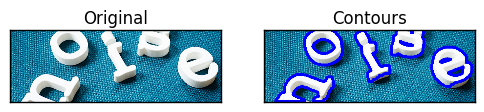

In [180]:
img = cv2.imread('Images\\open.png')
imgray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imgray,127,255,0)                                             # preparing binary image
imgCopy = np.copy(img)

kernel = np.ones((5,5),np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel,iterations=3)                  # Morphological opening operation

_,contours, hierarchy = cv2.findContours(opening,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)  # extracing contour

cv2.drawContours(imgCopy, contours, -1, (255,0,0), 7)                                    # Drawing contours

plt.subplot(121),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Original')
plt.subplot(122),plt.imshow(imgCopy[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Contours')
plt.show()

### Contour Features
#### Moments
Image moments help you to calculate some features like center of mass of the object, area of the object etc. The function **cv2.moments()** gives a dictionary of all moment values calculated. Check the following example:

convex : True
cx: 233 and cy: 170


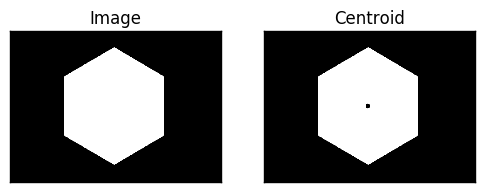

In [11]:
img = cv2.imread('Images\\hexagon.png',0)
ret,thresh = cv2.threshold(img,127,255,0)
_,contours,hierarchy = cv2.findContours(thresh, 1, cv2.THRESH_BINARY_INV)

cnt = contours[0]                                   
M = cv2.moments(cnt)
cx = int(M['m10']/M['m00'])
cy = int(M['m01']/M['m00'])

print('cx: {} and cy: {}'.format(cx,cy))

plt.subplot(121), plt.imshow(img,cmap='gray'),plt.xticks([]),plt.yticks([]),plt.title('Image')
cv2.circle(img,(cx,cy), 5, (0,0,255), -1) 
plt.subplot(122), plt.imshow(img,cmap='gray'),plt.xticks([]),plt.yticks([]),plt.title('Centroid')
plt.show()

#### Contour Area
Contour area is given by the function **cv2.contourArea()** or from moments, **M[‘m00’]**. We will using the same image we used in the above example.

In [182]:
img = cv2.imread('Images\\hexagon.png',0)
ret,thresh = cv2.threshold(img,127,255,0)
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)    # Finding contours

cnt = contours[0]                                   
M = cv2.moments(cnt)                                     # Getting image moment 
area = cv2.contourArea(cnt)                              # Calculating Area of a contour

print('Area of the Object using cv2.contourArea  : {}'.format(area))
print('Area of the Object using image moment[0,0]: {}'.format(M['m00']))
plt.show()

Area of the Object using cv2.contourArea  : 44140.0
Area of the Object using image moment[0,0]: 44140.0


#### Contour Perimeter
It is also called arc length. It can be found out using **cv2.arcLength()** function. Second argument specify whether shape is a closed contour (if passed True), or just a curve. We will be using the same image that we used before- 

In [183]:
img = cv2.imread('Images\\hexagon.png',0)
ret,thresh = cv2.threshold(img,127,255,0)
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)    # Finding contours

cnt = contours[0]
perimeter = cv2.arcLength(cnt,True)                      # Finding parameter
print('Perimeter : {}'.format(round(perimeter,2)))       # Rounding values upto two decimal points 

Perimeter : 819.35


#### Contour Approximation
It approximates a contour shape to another shape with less number of vertices depending upon the precision we specify. To understand this, suppose you are trying to find a square in an image, but due to some problems in the image, you didn’t get a perfect square, but a “bad shape”. Now you can use this function to approximate the shape. In this, second argument is called epsilon, which is maximum distance from contour to approximated contour. It is an accuracy parameter. A wise selection of epsilon is needed to get the correct output.

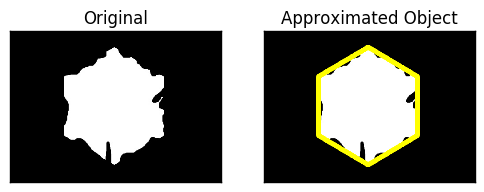

In [184]:
img = cv2.imread('Images\\hexagondistorted.jpg')
imgCopy = np.copy(img)
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,0)               # Getting binary image

_,contours,hierarchy = cv2.findContours(thresh, 1, 2)       # Finding contours

cnt = contours[0]

epsilon = 0.05*cv2.arcLength(cnt,True)                      # Selecting epsilon value 
approx = cv2.approxPolyDP(cnt,epsilon,True)                 # Approximating object

cv2.polylines(img,[approx],True,(0,255,255),10)
plt.subplot(121),plt.imshow(imgCopy[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Original')
plt.subplot(122),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Approximated Object')
plt.show()

#### Convex Hull
Convex Hull will look similar to contour approximation, but it is not (Both may provide same results in some cases). Here, cv2.convexHull() function checks a curve for convexity defects and corrects it. Generally speaking, convex curves are the curves which are always bulged out, or at-least flat. And if it is bulged inside, it is called convexity defects.
There is a little bit things to discuss about it its syntax:

> hull = cv2.convexHull(points[, hull[, clockwise[, returnPoints]]

Arguments details:

* **points** : are the contours we pass into.
* **hull** : is the output, normally we avoid it.
* **clockwise** : Orientation flag. If it is True, the output convex hull is oriented clockwise. Otherwise, it is oriented counter-clockwise.
* **returnPoints** : By default, True. Then it returns the coordinates of the hull points. If False, it returns the indices of contour points corresponding to the hull points.

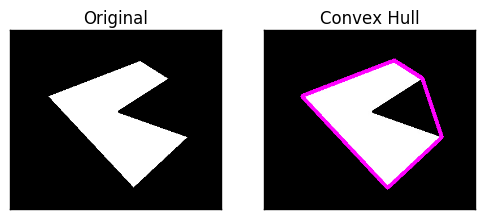

In [9]:
img = cv2.imread('Images\\con_inv.jpg')
imgCopy = np.copy(img)
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY_INV)               # Getting binary image
threshCopy = np.copy(thresh)
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)                           # Finding contours

cnt = contours[0]
hull = cv2.convexHull(cnt)
cv2.polylines(img,[hull],True,(255,0,255),5)
plt.subplot(121),plt.imshow(threshCopy,cmap='binary'),plt.xticks([]),plt.yticks([]),plt.title('Original')
plt.subplot(122),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Convex Hull')
plt.show()

#### Convexity Check 
We also have a function to check whether a given contour is convex or not. We will always perform this check to decide whether we need to find covex hull or not. Check out the following example-

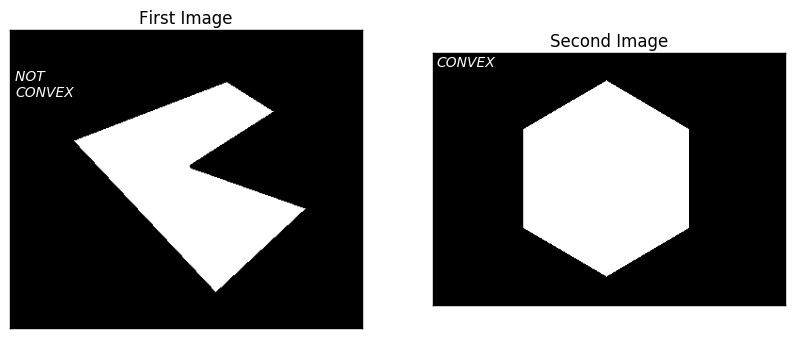

In [13]:
img = cv2.imread('Images\\con_inv.jpg')
imgCopy = np.copy(img)
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY)               # Getting binary image
threshCopy = np.copy(thresh)
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)       # Finding contours
test = ['NOT \nCONVEX','CONVEX']
cnt = contours[0]
k = cv2.isContourConvex(cnt)
cv2.polylines(img,[cnt],True,(255,0,255),5)

secimg = cv2.imread('Images\\hexagon.png')
secimgCopy = np.copy(secimg)
secimggray = cv2.cvtColor(secimg,cv2.COLOR_BGR2GRAY)
ret,secthresh = cv2.threshold(secimggray,127,255,cv2.THRESH_BINARY)               # Getting binary image
secthreshCopy = np.copy(secthresh)
_,seccontours,sechierarchy = cv2.findContours(secthresh, 1, 2)       # Finding contours

seccnt = seccontours[0]
seck = cv2.isContourConvex(cv2.convexHull(cnt))
cv2.polylines(secimg,[seccnt],True,(255,0,255),5)

fig, ax = plt.subplots(1,2,figsize=(10,5))
ax[0].imshow(threshCopy,cmap='binary_r'),ax[0].set_xticks([]),ax[0].set_yticks([]),ax[0].set_title('First Image')
ax[0].text(5, 70, test[k], style='italic',color='white')

ax[1].imshow(secthreshCopy,cmap='binary_r'),ax[1].set_xticks([]),ax[1].set_yticks([]),ax[1].set_title('Second Image')
ax[1].text(5, 17, test[seck], style='italic',color='white')
plt.show()

#### Bounding Rectangle
#### Straight Bounding Rectangle
It is a straight rectangle, it doesn’t consider the rotation of the object. So area of the bounding rectangle won’t be minimum. It is found by the function **cv2.boundingRect()**. It will return a tuple of four (x,y,w,h) where (x,y) will be the top-left coordinate of the rectangle and (w,h) be its width and height.
#### Straight Bounding Rectangle
Here, bounding rectangle is drawn with minimum area, so it considers the rotation also. The function used is cv2.minAreaRect(). It returns a Box2D structure which contains following detals - ( center (x,y), (width, height), angle of rotation ). But to draw this rectangle, we need 4 corners of the rectangle. It is obtained by the function cv2.boxPoints(). Both the rectangle are shown in the following example- 

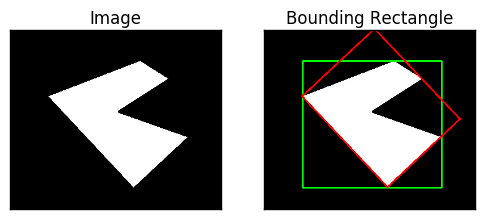

In [17]:
img = cv2.imread('Images\\con_inv.jpg')
imgCopy = np.copy(img)
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY)               # Getting binary image
threshCopy = np.copy(thresh)
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)       # Finding contours
cnt = contours[0]

x,y,w,h = cv2.boundingRect(cnt)                             # Calculating bounding rectangle
cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)              # Drawing rectangle on the image 

rect = cv2.minAreaRect(cnt)                                 # Finding minimum rectangle
box = cv2.boxPoints(rect)                                   # Getting the four coordinates
box = np.int0(box)
cv2.drawContours(img,[box],0,(0,0,255),2)                   # Drawing the minimum rectangle on the image 

plt.subplot(121),plt.imshow(threshCopy,cmap='binary_r'),plt.xticks([]),plt.yticks([]),plt.title('Image')
plt.subplot(122),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Bounding Rectangle')
plt.show()

#### Minimum Enclosing Circle
Next we find the circumcircle of an object using the function cv2.minEnclosingCircle(). It is a circle which completely covers the object with minimum area.

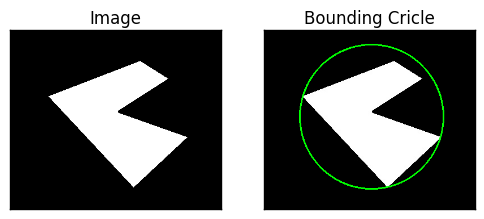

In [20]:
img = cv2.imread('Images\\con_inv.jpg')
imgCopy = np.copy(img)
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY)               # Getting binary image
threshCopy = np.copy(thresh)
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)                       # Finding contours
cnt = contours[0]

(x,y),radius = cv2.minEnclosingCircle(cnt)                                  # Finding minimum circle
center = (int(x),int(y))
radius = int(radius)
cv2.circle(img,center,radius,(0,255,0),2)                                   # Drawing minimum circle

plt.subplot(121),plt.imshow(threshCopy,cmap='binary_r'),plt.xticks([]),plt.yticks([]),plt.title('Image')
plt.subplot(122),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Bounding Cricle')
plt.show()

#### Minimum Enclosing Ellipse
Next one is to fit an ellipse to an object. It returns the rotated rectangle in which the ellipse is inscribed.

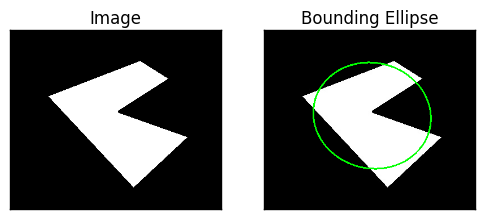

In [23]:
img = cv2.imread('Images\\con_inv.jpg')
imgCopy = np.copy(img)
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY)               # Getting binary image
threshCopy = np.copy(thresh)
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)                       # Finding contours
cnt = contours[0]

ellipse = cv2.fitEllipse(cnt)                                               # Getting the ellipse
cv2.ellipse(img,ellipse,(0,255,0),2)

plt.subplot(121),plt.imshow(threshCopy,cmap='binary_r'),plt.xticks([]),plt.yticks([]),plt.title('Image')
plt.subplot(122),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Bounding Ellipse')
plt.show()

#### Fitting a Line
Similarly we can fit a line to a set of points. Below image contains a set of white points. We can approximate a straight line to it.

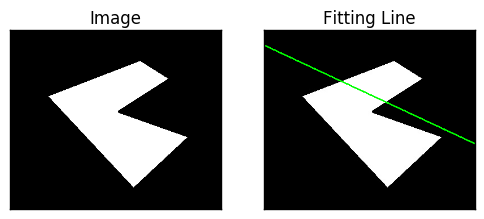

In [24]:
img = cv2.imread('Images\\con_inv.jpg')
imgCopy = np.copy(img)
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY)               # Getting binary image
threshCopy = np.copy(thresh)
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)                       # Finding contours
cnt = contours[0]

rows,cols = img.shape[:2]
[vx,vy,x,y] = cv2.fitLine(cnt, cv2.DIST_L2,0,0.01,0.01)
lefty = int((-x*vy/vx) + y)
righty = int(((cols-x)*vy/vx)+y)
cv2.line(img,(cols-1,righty),(0,lefty),(0,255,0),2)

plt.subplot(121),plt.imshow(threshCopy,cmap='binary_r'),plt.xticks([]),plt.yticks([]),plt.title('Image')
plt.subplot(122),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Fitting Line')
plt.show()

### Contour Properties
Here we will learn to extract some frequently used properties of objects like Solidity, Equivalent Diameter, Mask image, Mean Intensity etc.
#### Aspect Ratio
It is the ratio of width to height of bounding rect of the object.
$$Aspect \; Ratio = \frac{Width}{Height}$$


In [ ]:
img = cv2.imread('Images\\con_inv.jpg')
imgCopy = np.copy(img)
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY)               # Getting binary image
threshCopy = np.copy(thresh)
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)                       # Finding contours
cnt = contours[0]

x,y,w,h = cv2.boundingRect(cnt)
aspect_ratio = float(w)/h
print('Aspect Ratio: {}'.format(aspect_ratio))

cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)                              # Drawing rectangle on the image 
plt.subplot(121),plt.imshow(threshCopy,cmap='binary_r'),plt.xticks([]),plt.yticks([]),plt.title('Image')
plt.subplot(122),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Bounding Rectangle')
plt.show()

#### Extent
Extent is the ratio of contour area to bounding rectangle area.
$$Extent = \frac{Object \; Area}{Bounding \; Rectangle \; Area}$$

Extent: 0.432863028182


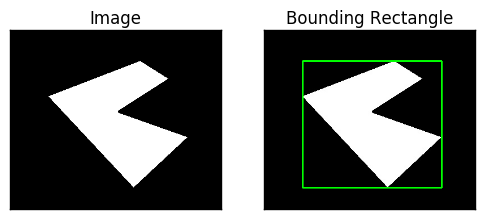

In [6]:
img = cv2.imread('Images\\con_inv.jpg')
imgCopy = np.copy(img)
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY)               # Getting binary image
threshCopy = np.copy(thresh)
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)                       # Finding contours
cnt = contours[0]

area = cv2.contourArea(cnt)
x,y,w,h = cv2.boundingRect(cnt)
rect_area = w*h
extent = float(area)/rect_area

print('Extent: {}'.format(extent))

cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),2)                              # Drawing rectangle on the image 
plt.subplot(121),plt.imshow(threshCopy,cmap='binary_r'),plt.xticks([]),plt.yticks([]),plt.title('Image')
plt.subplot(122),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Bounding Rectangle')
plt.show()

#### Solidity
Solidity is the ratio of contour area to its convex hull area.
$$Solidity = \frac{Contour \; Area}{Convex \; Hull \; Area}$$

In [ ]:
img = cv2.imread('Images\\con_inv.jpg')
imgCopy = np.copy(img)
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY_INV)               # Getting binary image
threshCopy = np.copy(thresh)
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)                           # Finding contours

cnt = contours[0]
hull = cv2.convexHull(cnt)
cv2.polylines(img,[hull],True,(255,0,255),5)

area = cv2.contourArea(cnt)
hull_area = cv2.contourArea(hull)
solidity = float(area)/hull_area
print('Solidity : {}'.format(solidity))

plt.subplot(121),plt.imshow(threshCopy,cmap='binary'),plt.xticks([]),plt.yticks([]),plt.title('Original')
plt.subplot(122),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Convex Hull')
plt.show()

#### Equivalent Diameter

Equivalent Diameter is the diameter of the circle whose area is same as the contour area.

$$Equivalent \; Diameter = \sqrt{\frac{4 \times Contour \; Area}{\pi}}$$

In [9]:
img = cv2.imread('Images\\con_inv.jpg')
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY_INV)               # Getting binary image
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)                           # Finding contours

cnt = contours[0]
area = cv2.contourArea(cnt)
equi_diameter = np.sqrt(4*area/np.pi)
print('Equivalent Diameter: {}'.format(equi_diameter))

Equivalent Diameter: 176.359563389


#### Orientation
Orientation is the angle at which object is directed. Following method also gives the Major Axis and Minor Axis lengths.

In [10]:
img = cv2.imread('Images\\con_inv.jpg')
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY_INV)               # Getting binary image
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)                           # Finding contours

cnt = contours[0]
(x,y),(MA,ma),angle = cv2.fitEllipse(cnt)
print('Orientation: {}'.format(angle))                                          # Same as angle of rotation of major axis

Orientation: 103.479347229


#### Mask and Pixel Points

In some cases, we may need all the points which comprises that object. It can be done as follows:

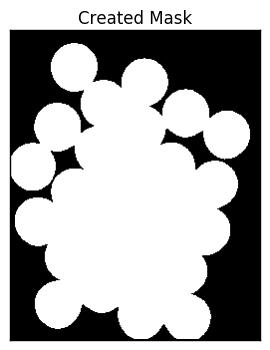

In [40]:
img = cv2.imread('Images\\coin.jpg')
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY_INV)               # Getting binary image
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)                           # Finding contours

cntArea = [cv2.contourArea(i) for i in contours]
cnt = contours[cntArea.index(max(cntArea))]                                     # Creating mask for the biggest contour

mask = np.zeros(imggray.shape,np.uint8)
cv2.drawContours(mask,[cnt],0,255,-1)
pixelpoints = cv2.findNonZero(mask)
plt.imshow(mask,cmap='binary_r'),plt.xticks([]),plt.yticks([]),plt.title('Created Mask')
plt.show()

#### Maximum Value, Minimum Value and their locations

We can find these parameters using a mask image

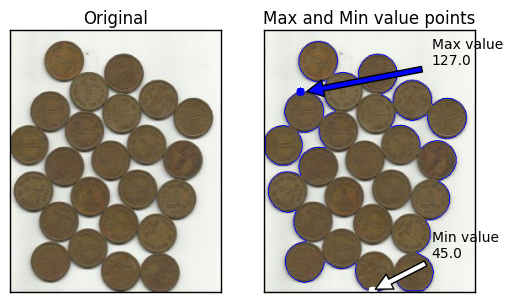

In [101]:
img = cv2.imread('Images\\coin.jpg')
copy_img = np.copy(img)
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY_INV)               # Getting binary image
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)                           # Finding contours

cnt = contours[14]
mask = np.zeros(imggray.shape,np.uint8)
cv2.drawContours(mask,[cnt],0,255,1)
cv2.drawContours(img,[cnt],0,255,1)

#plt.imshow(mask,cmap='gray'),plt.show()
    
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(imggray,mask = mask)
cv2.circle(img,min_loc, 5, (255,255,255), -1) 
cv2.circle(img,max_loc, 5, (255,0,0), -1) 
plt.subplot(121),plt.imshow(copy_img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Original')
plt.subplot(122),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Max and Min value points')
plt.subplot(122).annotate('Min value\n'+str( min_val), xy=min_loc, xytext=(200, 270),arrowprops=dict(facecolor='white', shrink=0.05))
plt.subplot(122).annotate('Max value\n'+str( max_val), xy=max_loc, xytext=(200, 40),arrowprops=dict(facecolor='blue', shrink=0.05))

plt.show()

#### Mean Color or Mean Intensity

Here, we can find the average color of an object. Or it can be average intensity of the object in grayscale mode. We again use the same mask to do it.

In [82]:
img = cv2.imread('Images\\coin.jpg')
copy_img = np.copy(img)
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY_INV)               # Getting binary image
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)                           # Finding contours

cnt = contours[14]
mask = np.zeros(imggray.shape,np.uint8)
cv2.drawContours(mask,[cnt],0,255,-1)

mean_val = cv2.mean(img,mask = mask)
print [int(x) for x in list(mean_val)]

[73, 97, 112, 0]


#### Extreme Points

Extreme Points means topmost, bottommost, rightmost and leftmost points of the object.

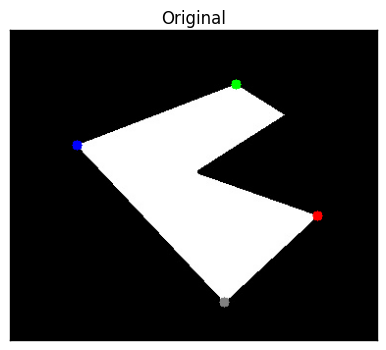

In [98]:
img = cv2.imread('Images\\con_inv.jpg')
imgCopy = np.copy(img)
imggray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret,thresh = cv2.threshold(imggray,127,255,cv2.THRESH_BINARY)               # Getting binary image
threshCopy = np.copy(thresh)
_,contours,hierarchy = cv2.findContours(thresh, 1, 2)                       # Finding contours
cnt = contours[0]

leftmost = tuple(cnt[cnt[:,:,0].argmin()][0])
rightmost = tuple(cnt[cnt[:,:,0].argmax()][0])
topmost = tuple(cnt[cnt[:,:,1].argmin()][0])
bottommost = tuple(cnt[cnt[:,:,1].argmax()][0])

cv2.circle(img,leftmost, 5, (255,0,0), -1)
cv2.circle(img,rightmost, 5, (0,0,255), -1)
cv2.circle(img,topmost, 5, (0,255,0), -1)
cv2.circle(img,bottommost, 5, (128,128,128), -1)

plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Original')
plt.show()

#### Convexity Defects
 Any deviation of the object from this hull can be considered as convexity defect. OpenCV comes with a ready-made function to find this, **cv2.convexityDefects()**.It returns an array where each row contains these values - [ start point, end point, farthest point, approximate distance to farthest point ]. We can visualize it using an image. We draw a line joining start point and end point, then draw a circle at the farthest point. Remember first three values returned are indices of cnt. So we have to bring those values from cnt.

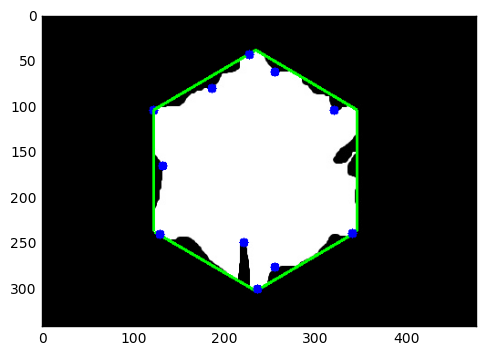

In [104]:

img = cv2.imread('Images\\hexagondistorted.jpg')
img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(img_gray, 127, 255,0)
_,contours,hierarchy = cv2.findContours(thresh,2,1)
cnt = contours[0]

hull = cv2.convexHull(cnt,returnPoints = False)
defects = cv2.convexityDefects(cnt,hull)

for i in range(defects.shape[0]):
    s,e,f,d = defects[i,0]
    start = tuple(cnt[s][0])
    end = tuple(cnt[e][0])
    far = tuple(cnt[f][0])
    cv2.line(img,start,end,[0,255,0],2)
    cv2.circle(img,far,5,[0,0,255],-1)

plt.imshow(img)
plt.show()

#### Point Polygon Test
This function finds the shortest distance between a point in the image and a contour. It returns the distance which is negative when point is outside the contour, positive when point is inside and zero if point is on the contour.
In the function, third argument is measureDist. If it is True, it finds the signed distance. If False, it finds whether the point is inside or outside or on the contour (it returns +1, -1, 0 respectively).  
**Note:** If you don’t want to find the distance, make sure third argument is False, because, it is a time consuming process. So, making it False gives about 2-3X speedup.

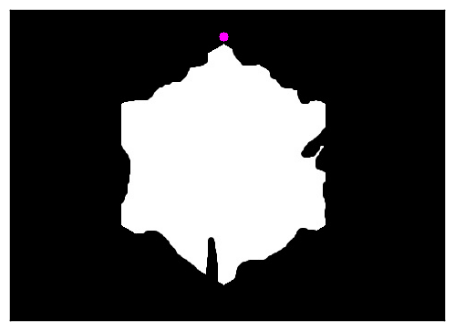

distance : 5.39
location : Outside


In [19]:
img = cv2.imread('Images\\hexagondistorted.jpg')
img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(img_gray, 127, 255,0)
_,contours,hierarchy = cv2.findContours(thresh,2,1)
cnt = contours[0]

loc = ['On Contour','Inside','Outside']              # Location

distance = cv2.pointPolygonTest(cnt,(234,30),True)   # Calculates the minimum distace from the object
location = cv2.pointPolygonTest(cnt,(234,30),False)  #tells us whether the point is inside(-1), outside(+1) or on the contour(0) 

cv2.circle(img,(234,30),5,(255,0,255),-1)
plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([])
plt.show()

print('distance : {}'.format(round(dist,2)))
print('location : {}'.format(loc[int(location)]))

#### Match Shapes
OpenCV comes with a function cv2.matchShapes() which enables us to compare two shapes, or two contours and returns a metric showing the similarity. **The lower the result, the better match it is**. It is calculated based on the hu-moment values. 

Similary between two images of zero : 0.0660706329642
Similary between two images of nine : 0.40832026173
Similary between two images of nine and zero : 0.193245543263


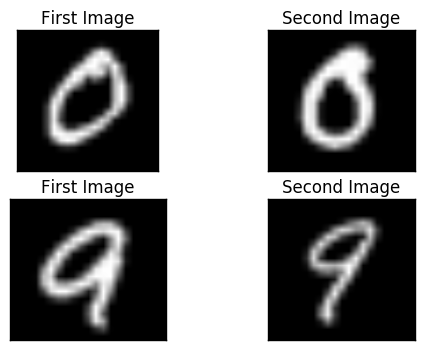

In [34]:
zero_first = cv2.imread('Images\\digits.png',0)[:21,:21]
zero_second = cv2.imread('Images\\digits.png',0)[41:61,:21]

nine_first = cv2.imread('Images\\digits.png',0)[981:,:21]
nine_second = cv2.imread('Images\\digits.png',0)[961:981,:21]

ret, thresh = cv2.threshold(zero_first, 127, 255,0)
ret, thresh2 = cv2.threshold(zero_second, 127, 255,0)
_, contours, hierarchy = cv2.findContours(thresh,2,1)
cnt1 = contours[0]
_, contours, hierarchy = cv2.findContours(thresh2,2,1)
cnt2 = contours[0]

ret, thresh3 = cv2.threshold(nine_first, 127, 255,0)
ret, thresh4 = cv2.threshold(nine_second, 127, 255,0)
_, contours, hierarchy = cv2.findContours(thresh3,2,1)
cnt3 = contours[0]
_, contours, hierarchy = cv2.findContours(thresh4,2,1)
cnt4 = contours[0]

ret = cv2.matchShapes(cnt1,cnt2,1,0.0)          # Calculating similarity between two zero's
ret1 = cv2.matchShapes(cnt3,cnt4,1,0.0)         # Calculating similarity between two nine's
ret2 = cv2.matchShapes(cnt2,cnt3,1,0.0)         # Calculating similarity between zero and nine 

print('Similary between two images of zero : {}'.format(ret))
print('Similary between two images of nine : {}'.format(ret1))
print('Similary between two images of nine and zero : {}'.format(ret2))

plt.subplot(221),plt.imshow(zero_first,cmap='gray'),plt.xticks([]),plt.yticks([]),plt.title('First Image')
plt.subplot(222),plt.imshow(zero_second,cmap='gray'),plt.xticks([]),plt.yticks([]),plt.title('Second Image')

plt.subplot(223),plt.imshow(nine_first,cmap='gray'),plt.xticks([]),plt.yticks([]),plt.title('First Image')
plt.subplot(224),plt.imshow(nine_second,cmap='gray'),plt.xticks([]),plt.yticks([]),plt.title('Second Image')
plt.show()

#### Template Matching
Template Matching is a method for searching and finding the location of a template image in a larger image. OpenCV comes with a function **cv2.matchTemplate()** for this purpose. It simply slides the template image over the input image (as in 2D convolution) and compares the template and patch of input image under the template image.OpenCV implements Template matching in the function matchTemplate. The available methods-
* **CV_TM_SQDIFF**
$$R(x,y)= \sum _{x',y'} (T(x',y')-I(x+x',y+y'))^2$$
* **CV_TM_SQDIFF_NORMED**
$$R(x,y)= \frac{\sum_{x',y'} (T(x',y')-I(x+x',y+y'))^2}{\sqrt{\sum_{x',y'}T(x',y')^2 \cdot \sum_{x',y'} I(x+x',y+y')^2}}$$
* **CV_TM_CCORR**
$$R(x,y)= \sum _{x',y'} (T(x',y')  \cdot I(x+x',y+y'))$$
* **CV_TM_CCORR_NORMED**
$$R(x,y)= \frac{\sum_{x',y'} (T(x',y') \cdot I(x+x',y+y'))}{\sqrt{\sum_{x',y'}T(x',y')^2 \cdot \sum_{x',y'} I(x+x',y+y')^2}}$$
* **CV_TM_CCOEFF**
$$R(x,y)= \sum _{x',y'} (T'(x',y')  \cdot I'(x+x',y+y'))$$
where
$$\begin{array}{l} T'(x',y')=T(x',y') - 1/(w  \cdot h)  \cdot \sum _{x'',y''} T(x'',y'') \\ I'(x+x',y+y')=I(x+x',y+y') - 1/(w  \cdot h)  \cdot \sum _{x'',y''} I(x+x'',y+y'') \end{array}$$
* **CV_TM_CCOEFF_NORMED**
$$R(x,y)= \frac{ \sum_{x',y'} (T'(x',y') \cdot I'(x+x',y+y')) }{ \sqrt{\sum_{x',y'}T'(x',y')^2 \cdot \sum_{x',y'} I'(x+x',y+y')^2} }$$

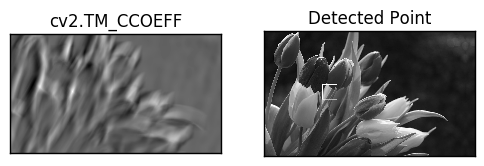

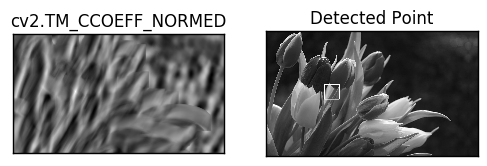

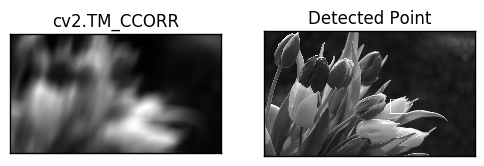

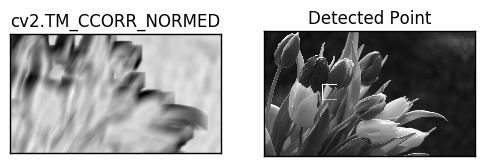

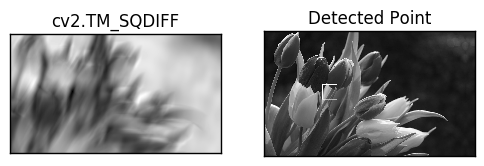

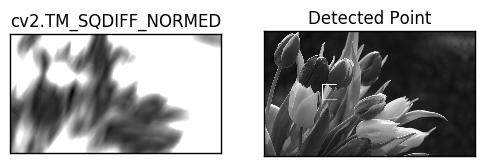

In [14]:
img = cv2.imread('Images\\flower.jpg',0)
img2 = img.copy()
template = cv2.imread('Images\\flower-small.png',0)
w, h = template.shape[::-1]

# All the 6 methods for comparison in a list
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
            'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2.copy()
    method = eval(meth)

    # Apply template Matching
    res = cv2.matchTemplate(img,template,method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv2.rectangle(img,top_left, bottom_right, 255, 3)

    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title(meth), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img,cmap = 'gray')
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    #plt.suptitle(meth)

    plt.show()

## Object Detection
### Face Detection using Haar Cascades
We will work with [face detection](https://youtu.be/WfdYYNamHZ8) for now. Initially, the algorithm needs a lot of positive images (images of faces) and negative images (images without faces) to train the classifier. Then we need to extract features from it. For this, haar features shown in below image are used. They are just like our convolutional kernel. Each feature is a single value obtained by subtracting sum of pixels under white rectangle from sum of pixels under black rectangle.
![Haar Feature](Images\haar_features.jpg)
Now all possible sizes and locations of each kernel is used to calculate plenty of features. (Just imagine how much computation it needs? Even a 24x24 window results over 160000 features). For each feature calculation, we need to find sum of pixels under white and black rectangles. To solve this, they introduced the integral images. It simplifies calculation of sum of pixels, how large may be the number of pixels, to an operation involving just four pixels. Nice, isn’t it? It makes things super-fast.

But among all these features we calculated, most of them are irrelevant. For example, consider the image below. Top row shows two good features. The first feature selected seems to focus on the property that the region of the eyes is often darker than the region of the nose and cheeks. The second feature selected relies on the property that the eyes are darker than the bridge of the nose. But the same windows applying on cheeks or any other place is irrelevant. So how do we select the best features out of 160000+ features? It is achieved by Adaboost.![Haar feature applied on face](Images\haar.png)
For this, we apply each and every feature on all the training images. For each feature, it finds the best threshold which will classify the faces to positive and negative. But obviously, there will be errors or misclassifications. We select the features with minimum error rate, which means they are the features that best classifies the face and non-face images. (The process is not as simple as this. Each image is given an equal weight in the beginning. After each classification, weights of misclassified images are increased. Then again same process is done. New error rates are calculated. Also new weights. The process is continued until required accuracy or error rate is achieved or required number of features are found).

Final classifier is a weighted sum of these weak classifiers. It is called weak because it alone can’t classify the image, but together with others forms a strong classifier. Instead of applying all the 6000 features on a window, group the features into different stages of classifiers and apply one-by-one. (Normally first few stages will contain very less number of features). If a window fails the first stage, discard it. We don’t consider remaining features on it. If it passes, apply the second stage of features and continue the process. The window which passes all stages is a face region. 

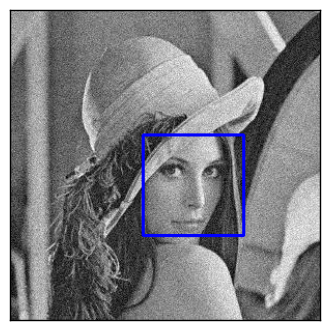

In [3]:
face_cascade = cv2.CascadeClassifier('Images\\haarcascade_frontalface_default.xml') # Loading cascade classifier

img = cv2.imread('Images\\lena.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray, 1.3, 5)                                 # Detecting faces
for (x,y,w,h) in faces:                                                             # drawing rectangle on the detected face
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
    
plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([])
plt.show()

##  Machine Learning
### K-Nearest Neighbour
kNN is one of the simplest of classification algorithms available for supervised learning. The idea is to search for closest match of the test data in feature space. We will look into it with below image.

Understanding kNN
In the image, there are two families, Blue Squares and Red Triangles. We call each family as Class. Their houses are shown in their town map which we call feature space. (You can consider a feature space as a space where all datas are projected. For example, consider a 2D coordinate space. Each data has two features, x and y coordinates. You can represent this data in your 2D coordinate space, right? Now imagine if there are three features, you need 3D space. Now consider N features, where you need N-dimensional space, right? This N-dimensional space is its feature space. In our image, you can consider it as a 2D case with two features).

Now a new member comes into the town and creates a new home, which is shown as green circle. He should be added to one of these Blue/Red families. We call that process, Classification. What we do? Since we are dealing with kNN, let us apply this algorithm.

One method is to check who is his nearest neighbour. From the image, it is clear it is the Red Triangle family. So he is also added into Red Triangle. This method is called simply Nearest Neighbour, because classification depends only on the nearest neighbour.

But there is a problem with that. Red Triangle may be the nearest. But what if there are lot of Blue Squares near to him? Then Blue Squares have more strength in that locality than Red Triangle. So just checking nearest one is not sufficient. Instead we check some k nearest families. Then whoever is majority in them, the new guy belongs to that family. In our image, let’s take k=3, ie 3 nearest families. He has two Red and one Blue (there are two Blues equidistant, but since k=3, we take only one of them), so again he should be added to Red family. But what if we take k=7? Then he has 5 Blue families and 2 Red families. Great!! Now he should be added to Blue family. So it all changes with value of k. More funny thing is, what if k = 4? He has 2 Red and 2 Blue neighbours. It is a tie !!! So better take k as an odd number. So this method is called k-Nearest Neighbour since classification depends on k nearest neighbours.

Our goal here is to build an application which can read the handwritten digits. OpenCV comes with an image digits.png (in the folder opencv/samples/python2/data/) which has 5000 handwritten digits (500 for each digit). Each digit is a 20x20 image. So our first step is to split this image into 5000 different digits. For each digit, we flatten it into a single row with 400 pixels. That is our feature set, ie intensity values of all pixels. It is the simplest feature set we can create. We use first 250 samples of each digit as train_data, and next 250 samples as test_data. 

In [20]:
img = cv2.imread('Images\\digits.png')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# Now we split the image to 5000 cells, each 20x20 size
cells = [np.hsplit(row,100) for row in np.vsplit(gray,50)]

# Make it into a Numpy array. It size will be (50,100,20,20)
x = np.array(cells)

# Now we prepare train_data and test_data.
train = x[:,:50].reshape(-1,400).astype(np.float32) # Size = (2500,400)
test = x[:,50:100].reshape(-1,400).astype(np.float32) # Size = (2500,400)

# Create labels for train and test data
k = np.arange(10)
train_labels = np.repeat(k,250)[:,np.newaxis]
test_labels = train_labels.copy()

# Initiate kNN, train the data, then test it with test data for k=1
knn = cv2.ml.KNearest_create()
knn.train(train,cv2.ml.ROW_SAMPLE,train_labels)
ret,result,neighbours,dist = knn.findNearest(test,k=5)

# Now we check the accuracy of classification
# For that, compare the result with test_labels and check which are wrong
matches = result==test_labels
correct = np.count_nonzero(matches)
accuracy = correct*100.0/result.size
print accuracy

91.76


### K-Means Clustering
K-means clustering is a method of vector quantization, originally from signal processing, that is popular for cluster analysis in data mining. k-means clustering aims to partition n observations into k clusters in which each observation belongs to the cluster with the nearest mean, serving as a prototype of the cluster.

This algorithm is an iterative process. We will explain it step-by-step with the help of images.Consider a set of data as below ( You can consider it as t-shirt problem). We need to cluster this data into two groups.![Data](Images\kmeans_testdata.jpg)

* **Step : 1** - Algorithm randomly chooses two centroids, C1 and C2 (sometimes, any two data are taken as the centroids).

* **Step : 2** - It calculates the distance from each point to both centroids. If a test data is more closer to C1, then that data is labelled with ‘0’. If it is closer to C2, then labelled as ‘1’ (If more centroids are there, labelled as ‘2’,‘3’ etc).

In our case, we will color all ‘0’ labelled with red, and ‘1’ labelled with blue. So we get following image after above operations.![Initial Labelling](Images\initial_labelling.jpg)
* **Step : 3** - Next we calculate the average of all blue points and red points separately and that will be our new centroids. That is C1 and C2 shift to newly calculated centroids. (Remember, the images shown are not true values and not to true scale, it is just for demonstration only).

And again, perform step 2 with new centroids and label data to ‘0’ and ‘1’.

So we get result as below :![New Centroid Calculated and Data Re-laballed](Images\update_centroid.jpg)


Now **Step - 2** and **Step - 3** are iterated until both centroids are converged to fixed points. (Or it may be stopped depending on the criteria we provide, like maximum number of iterations, or a specific accuracy is reached etc.) These points are such that sum of distances between test data and their corresponding centroids are minimum. Or simply, sum of distances between C1 $\leftrightarrow$ Red$\_$Points and C2 $\leftrightarrow$ Blue$\_$Points is minimum.

$$minimize \;\bigg[J = \sum_{All\: Red_Points}distance(C1,Red\_Point) + \sum_{All\: Blue\_Points}distance(C2,Blue\_Point)\bigg]$$

Final result almost looks like below :

![Final Result](Images\final_clusters.jpg)

**Color Quantization** is the process of reducing number of colors in an image. One reason to do so is to reduce the memory. There are 3 features, say, R,G,B. So we need to reshape the image to an array of Mx3 size (M is number of pixels in image). And after the clustering, we apply centroid values (it is also R,G,B) to all pixels, such that resulting image will have specified number of colors. And again we need to reshape it back to the shape of original image.

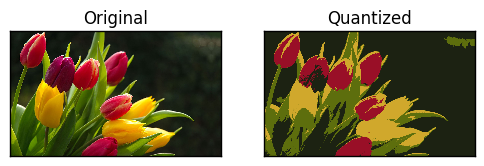

In [23]:
img = cv2.imread('Images\\flower.jpg')
Z = img.reshape((-1,3))

# convert to np.float32
Z = np.float32(Z)

# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
K = 4
ret,label,center=cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)

# Now convert back into uint8, and make original image
center = np.uint8(center)
res = center[label.flatten()]
res2 = res.reshape((img.shape))

plt.subplot(121),plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Original')
plt.subplot(122),plt.imshow(res2[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Quantized')
plt.show()

###  SVM
#### Linearly Separable Data
Consider the image below which has two types of data, red and blue. In kNN, for a test data, we used to measure its distance to all the training samples and take the one with minimum distance. It takes plenty of time to measure all the distances and plenty of memory to store all the training-samples. But considering the data given in image, should we need that much?
![Linearly separable data](Images\svm_basics1.png)
Consider another idea. We find a line, $f(x)=ax_1+bx_2+c$ which divides both the data to two regions. When we get a new test_data X, just substitute it in $f(x)$. If $f(X) > 0$, it belongs to blue group, else it belongs to red group. We can call this line as Decision Boundary. It is very simple and memory-efficient. Such data which can be divided into two with a straight line (or hyperplanes in higher dimensions) is called Linear Separable.

So in above image, you can see plenty of such lines are possible. Which one we will take? Very intuitively we can say that the line should be passing as far as possible from all the points. Why? Because there can be noise in the incoming data. This data should not affect the classification accuracy. So taking a farthest line will provide more immunity against noise. So what SVM does is to find a straight line (or hyperplane) with largest minimum distance to the training samples. See the bold line in below image passing through the center.
![Large Margin Classifier](Images\svm_basics2.png)
So to find this Decision Boundary, you need training data. Do you need all? NO. Just the ones which are close to the opposite group are sufficient. In our image, they are the one blue filled circle and two red filled squares. We can call them Support Vectors and the lines passing through them are called Support Planes. They are adequate for finding our decision boundary. We need not worry about all the data. It helps in data reduction.

What happened is, first two hyperplanes are found which best represents the data. For eg, blue data is represented by $w^Tx+b_0 > 1$ while red data is represented by $w^Tx+b_0 < -1$ where w is weight vector $( w=[w_1, w_2,..., w_n])$ and $x$ is the feature vector $(x = [x_1,x_2,..., x_n])$. $b_0$ is the bias. Weight vector decides the orientation of decision boundary while bias point decides its location. Now decision boundary is defined to be midway between these hyperplanes, so expressed as $w^Tx+b_0 = 0$. The minimum distance from support vector to the decision boundary is given by, $distance_{support \, vectors}=\frac{1}{||w||}$. Margin is twice this distance, and we need to maximize this margin. i.e. we need to minimize a new function $L(w, b_0)$ with some constraints which can expressed easily. We changed to this new form as it is a well known optimization problem of type [quadratic programming problem](https://en.wikipedia.org/wiki/Quadratic_programming) which are comapritively easy to solve and have a unique solution:

$$\min_{w, b_0} L(w, b_0) = \frac{1}{2}||w||^2 \; \text{subject to} \; t_i(w^Tx+b_0) \geq 1 \; \forall i$$

where $t_i$ is the label of each class, $t_i \in [-1,1]$.
#### Non-Linearly Separable Data
Consider some data which can’t be divided into two with a straight line. For example, consider an one-dimensional data where ‘X’ is at -3 & +3 and ‘$O$’ is at -1 & +1. Clearly it is not linearly separable. But there are methods to solve these kinds of problems. If we can map this data set with a function, $f(x) = x^2$, we get ‘$X$’ at 9 and ‘$O$’ at 1 which are linear separable.

Otherwise we can convert this one-dimensional to two-dimensional data. We can use $f(x)=(x,x^2)$ function to map this data. Then ‘$X$’ becomes $(-3,9)$ and $(3,9)$ while ‘$O$’ becomes $(-1,1)$ and $(1,1)$. This is also linear separable. In short, chance is more for a non-linear separable data in lower-dimensional space to become linear separable in higher-dimensional space.

In general, it is possible to map points in a d-dimensional space to some D-dimensional space (D>d) to check the possibility of linear separability. There is an idea which helps to compute the dot product in the high-dimensional (kernel) space by performing computations in the low-dimensional input (feature) space. We can illustrate with following example.

Consider two points in two-dimensional space, $p=(p_1,p_2)$ and $q=(q_1,q_2)$. Let $\phi$ be a mapping function which maps a two-dimensional point to three-dimensional space as follows:

$$\phi (p) = (p_{1}^2,p_{2}^2,\sqrt{2} p_1 p_2)$$
$$\phi (q) = (q_{1}^2,q_{2}^2,\sqrt{2} q_1 q_2)$$

Let us define a kernel function $K(p,q)$ which does a dot product between two points, shown below:

$$
\begin{align}
K(p,q)  = \phi(p).\phi(q) & = \phi(p)^T \phi(q) \\
                          & = (p_{1}^2,p_{2}^2,\sqrt{2} p_1 p_2).(q_{1}^2,q_{2}^2,\sqrt{2} q_1 q_2) \\
                          & = p_1 q_1 + p_2 q_2 + 2 p_1 q_1 p_2 q_2 \\
                          & = (p_1 q_1 + p_2 q_2)^2 \\
          \phi(p).\phi(q) & = (p.q)^2
\end{align}
$$

It means, a dot product in three-dimensional space can be achieved using squared dot product in two-dimensional space. This can be applied to higher dimensional space. So we can calculate higher dimensional features from lower dimensions itself. Once we map them, we get a higher dimensional space.

In addition to all these concepts, there comes the problem of misclassification. So just finding decision boundary with maximum margin is not sufficient. We need to consider the problem of misclassification errors also. Sometimes, it may be possible to find a decision boundary with less margin, but with reduced misclassification. Anyway we need to modify our model such that it should find decision boundary with maximum margin, but with less misclassification. The minimization criteria is modified as:

$$min \; ||w||^2 + C(distance \; of \; misclassified \; samples \; to \; their \; correct \; regions)$$

Below image shows this concept. For each sample of the training data a new parameter $\xi_i$ is defined. It is the distance from its corresponding training sample to their correct decision region. For those who are not misclassified, they fall on their corresponding support planes, so their distance is zero.
![Misclassification Error](Images\svm_basics3.png)
So the new optimization problem is :

$$\min_{w, b_{0}} L(w,b_0) = ||w||^{2} + C \sum_{i} {\xi_{i}} \text{ subject to } y_{i}(w^{T} x_{i} + b_{0}) \geq 1 - \xi_{i} \text{ and } \xi_{i} \geq 0 \text{ } \forall i$$

How should the parameter C be chosen? It is obvious that the answer to this question depends on how the training data is distributed. Although there is no general answer, it is useful to take into account these rules:

* Large values of C give solutions with less misclassification errors but a smaller margin. Consider that in this case it is expensive to make misclassification errors. Since the aim of the optimization is to minimize the argument, few misclassifications errors are allowed.
* Small values of C give solutions with bigger margin and more classification errors. In this case the minimization does not consider that much the term of the sum so it focuses more on finding a hyperplane with big margin.

We will be using [Histogram of Oriented Gradients](http://www.learnopencv.com/histogram-of-oriented-gradients/) to create a more powerfull feature vector instead of using just the color intensity of pixels in an image. The resulting feature vector will be more robusts again translation invariance and scale invariance. This method has been extensively used for pedestrian detection and detection partially occuluded objects in an image. 

In [5]:
SZ=20
bin_n = 16                                                                      # Number of bins for histogram

affine_flags = cv2.WARP_INVERSE_MAP|cv2.INTER_LINEAR

def deskew(img):
    m = cv2.moments(img)
    if abs(m['mu02']) < 1e-2:
        return img.copy()
    skew = m['mu11']/m['mu02']
    M = np.float32([[1, skew, -0.5*SZ*skew], [0, 1, 0]])
    img = cv2.warpAffine(img,M,(SZ, SZ),flags=affine_flags)
    return img

def hog(img):
    gx = cv2.Sobel(img, cv2.CV_32F, 1, 0)
    gy = cv2.Sobel(img, cv2.CV_32F, 0, 1)
    mag, ang = cv2.cartToPolar(gx, gy)
    bins = np.int32(bin_n*ang/(2*np.pi))                                        # quantizing binvalues in (0...16)
    bin_cells = bins[:10,:10], bins[10:,:10], bins[:10,10:], bins[10:,10:]      # Creating local blocks of 10 X 10
    mag_cells = mag[:10,:10], mag[10:,:10], mag[:10,10:], mag[10:,10:]          # Creating local blocks of 10 X 10
    hists = [np.bincount(b.ravel(), m.ravel(), bin_n) for b, m in zip(bin_cells, mag_cells)]
    hist = np.hstack(hists)                                                     # hist is a 64 bit vector
    return hist

img = cv2.imread('Images\\digits.png',0)

cells = [np.hsplit(row,100) for row in np.vsplit(img,50)]                       # Splitting the image into cells containing 
                                                                                # single digit
# First half is trainData, remaining is testData
train_cells = [ i[:50] for i in cells ]
test_cells = [ i[50:] for i in cells]

######     Now training      ########################

deskewed = [map(deskew,row) for row in train_cells]                             # deskewing every digit
hogdata = [map(hog,row) for row in deskewed]                                    # calculating HOG
trainData = np.float32(hogdata).reshape(-1,64)                              
responses = np.int32(np.repeat(np.arange(10),250)[:,np.newaxis])

svm = cv2.ml.SVM_create()
svm.setKernel(cv2.ml.SVM_LINEAR)
svm.setType(cv2.ml.SVM_C_SVC)
svm.setC(2.67)
svm.setGamma(5.383)
svm.train(trainData,cv2.ml.ROW_SAMPLE,responses)
svm.save('Images\\svm_data.dat')

######     Now testing      ########################

deskewed = [map(deskew,row) for row in test_cells]
hogdata = [map(hog,row) for row in deskewed]
testData = np.float32(hogdata).reshape(-1,bin_n*4)
result = svm.predict(testData)

#######   Check Accuracy   ########################
mask = result[1]==responses
correct = np.count_nonzero(mask)
print('Accuracy: {}'.format( (correct*100.0)/(result[1].size)))

Accuracy: 93.8


## Feature Detection and Description
### Understanding Features
The main thing to understand here is that what is a feature and what exactly makes it a feature. The answer is, we are looking for specific patterns or specific features which are unique, which can be easily tracked, which can be easily compared. lets take an example image to concrete our understanding of what is feature-
![Understanding Features](Images\feature_building.jpg)

Image is very simple. At the top of image, six small image patches are given. Question for you is to find the exact location of these patches in the original image. How many correct results you can find ?

A and B are flat surfaces, and they are spread in a lot of area. It is difficult to find the exact location of these patches.

C and D are much more simpler. They are edges of the building. You can find an approximate location, but exact location is still difficult. It is because, along the edge, it is same everywhere. Normal to the edge, it is different. So edge is a much better feature compared to flat area, but not good enough (It is good in jigsaw puzzle for comparing continuity of edges).

Finally, E and F are some corners of the building. And they can be easily found out. Because at corners, wherever you move this patch, it will look different. So they can be considered as a good feature. 

So finding these image features is called **Feature Detection** and describing the region around the feature so that we can find it in other images is called **Feature Description**.

### Harris Corner Detection
Chris Harris & Mike Stephens took a simple idea of basically finding the difference in intensity for a displacement of (u,v) in all directions to a mathematical form. This is expressed as below:

$$E(u,v) = \sum_{x,y} \underbrace{w(x,y)}_\text{window function} \, [\underbrace{I(x+u,y+v)}_\text{shifted intensity}-\underbrace{I(x,y)}_\text{intensity}]^2$$

Window function is either a rectangular window or gaussian window which gives weights to pixels underneath.

We have to maximize this function E(u,v) for corner detection. That means, we have to maximize the second term. Applying Taylor Expansion to above equation and using some mathematical steps (please refer any standard text books you like for full derivation), we get the final equation as:

$$E(u,v) \approx \begin{bmatrix} u & v \end{bmatrix} M \begin{bmatrix} u \\ v \end{bmatrix}$$

where

$$M = \sum_{x,y} w(x,y) \begin{bmatrix}I_x I_x & I_x I_y \\
                                     I_x I_y & I_y I_y \end{bmatrix}$$

Here, $I_x$ and $I_y$ are image derivatives in x and y directions respectively. (Can be easily found out using **cv2.Sobel()**).
Then comes the main part. After this, they created a score, basically an equation, which will determine if a window can contain a corner or not.

$$R = det(M) - k(trace(M))^2$$

where
* det(M) = $\lambda_1$ $\lambda_2$
* trace(M) = $\lambda_1$ + $\lambda_2$
* $\lambda_1$ and $\lambda_2$ are the eigen values of M

So the values of these eigen values decide whether a region is corner, edge or flat.

* When |R| is small, which happens when $\lambda_1$ and $\lambda_2$ are small, the region is flat.
* When R<0, which happens when $\lambda_1$ >> $\lambda_2$ or vice versa, the region is edge.
* When R is large, which happens when $\lambda_1$ and $\lambda_2$ are large and $\lambda_1$ $\sim$ $\lambda_2$, the region is a corner.

OpenCV has the function cv2.cornerHarris() for this purpose. Its arguments are :

* **img** - Input image, it should be grayscale and float32 type.
* **blockSize** - It is the size of neighbourhood considered for corner detection
* **ksize** - Aperture parameter of Sobel derivative used.
* **k** - Harris detector free parameter in the equation.

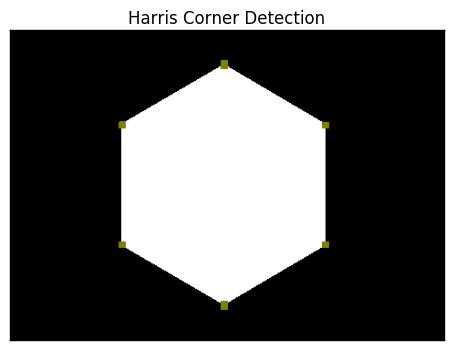

In [20]:
img = cv2.imread('Images\\hexagon.png')                           
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

gray = np.float32(gray)
dst = cv2.cornerHarris(gray,2,3,0.04)                             # Harris corner dectection                     

#result is dilated for marking the corners, not necessary
dst = cv2.dilate(dst,None,iterations=3)

# Threshold for an optimal value, it may vary depending on the image.
img[dst>0.01*dst.max()]=[0,128,128]

plt.imshow(img[:,:,::-1]),plt.xticks([]),plt.yticks([]),plt.title('Harris Corner Detection')
plt.show()

### Shi-Tomasi Corner Detector & Good Features to Track
in 1994, J. Shi and C. Tomasi made a small modification to it in their paper Good Features to Track which shows better results compared to Harris Corner Detector. The scoring function in Harris Corner Detector was given by:

$$R = \lambda_1 \lambda_2 - k(\lambda_1+\lambda_2)^2$$

Instead of this, Shi-Tomasi proposed:

$$R = min(\lambda_1, \lambda_2)$$

If it is a greater than a threshold value, it is considered as a corner. OpenCV has a function, **cv2.goodFeaturesToTrack()**. It finds N strongest corners in the image by Shi-Tomasi method (or Harris Corner Detection, if you specify it). As usual, image should be a grayscale image. Then you specify number of corners you want to find. Then you specify the quality level, which is a value between 0-1, which denotes the minimum quality of corner below which everyone is rejected. Then we provide the minimum euclidean distance between corners detected.

With all these informations, the function finds corners in the image. All corners below quality level are rejected. Then it sorts the remaining corners based on quality in the descending order. Then function takes first strongest corner, throws away all the nearby corners in the range of minimum distance and returns N strongest corners.

In below example, we will try to find 5 best corners:

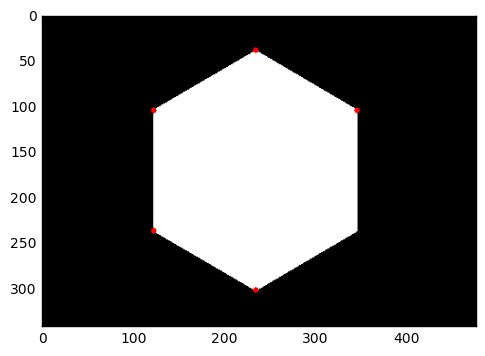

In [25]:
img = cv2.imread('Images\\hexagon.png')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

corners = cv2.goodFeaturesToTrack(gray,5,0.01,10)
corners = np.int0(corners)

for i in corners:
    x,y = i.ravel()
    cv2.circle(img,(x,y),3,255,-1)

plt.imshow(img)
plt.show()

### SIFT (Scale-Invariant Feature Transform)
We saw corner detector Harris which is rotation-invariant, which means, even if the image is rotated, we can find the same corners. It is obvious because corners remain corners in rotated image also. But what about scaling? A corner may not be a corner if the image is scaled. For example, check a simple image below. A corner in a small image within a small window is flat when it is zoomed in the same window. So Harris corner is not scale invariant.
![Effect of scaling on corner](Images\sift_scale_invariant.jpg)
So, in 2004, D.Lowe, University of British Columbia, came up with a new algorithm, Scale Invariant Feature Transform (SIFT) in his paper, Distinctive Image Features from Scale-Invariant Keypoints, which extract keypoints and compute its descriptors.

There are mainly four steps involved in SIFT algorithm. We will see them one-by-one.
#### Scale-space Extrema Detection
From the image above, it is obvious that we can’t use the same window to detect keypoints with different scale. It is OK with small corner. But to detect larger corners we need larger windows. For this, scale-space filtering is used. In it, Laplacian of Gaussian is found for the image with various $\sigma$ values. LoG acts as a blob detector which detects blobs in various sizes due to change in $\sigma$. In short, $\sigma$ acts as a scaling parameter. For eg, in the above image, gaussian kernel with low $\sigma$ gives high value for small corner while guassian kernel with high $\sigma$ fits well for larger corner. So, we can find the local maxima across the scale and space which gives us a list of (x,y,$\sigma$) values which means there is a potential keypoint at (x,y) at $\sigma$ scale.

But this LoG is a little costly, so SIFT algorithm uses Difference of Gaussians which is an approximation of LoG. Difference of Gaussian is obtained as the difference of Gaussian blurring of an image with two different $\sigma$, let it be $\sigma$ and k$\sigma$. This process is done for different octaves of the image in Gaussian Pyramid. It is represented in below image:

![Difference of Gaussian](Images\sift_dog.jpg)

Once this DoG are found, images are searched for local extrema over scale and space. For eg, one pixel in an image is compared with its 8 neighbours as well as 9 pixels in next scale and 9 pixels in previous scales. If it is a local extrema, it is a potential keypoint. It basically means that keypoint is best represented in that scale. It is shown in below image:

![Difference of Gaussian](Images\sift_local_extrema.jpg)

Regarding different parameters, the paper gives some empirical data which can be summarized as, number of octaves = 4, number of scale levels = 5, initial $\sigma=1.6$, $k=\sqrt{2}$ etc as optimal values.

#### Keypoint Localization
Once potential keypoints locations are found, they have to be refined to get more accurate results. They used Taylor series expansion of scale space to get more accurate location of extrema, and if the intensity at this extrema is less than a threshold value (0.03 as per the paper), it is rejected. This threshold is called **contrastThreshold** in OpenCV.

DoG has higher response for edges, so edges also need to be removed. For this, a concept similar to Harris corner detector is used. They used a 2x2 Hessian matrix (H) to compute the pricipal curvature. We know from Harris corner detector that for edges, one eigen value is larger than the other. So here they used a simple function, If this ratio is greater than a threshold, called **edgeThreshold** in OpenCV, that keypoint is discarded. It is given as 10 in paper. So it eliminates any low-contrast keypoints and edge keypoints and what remains is strong interest points.

#### Orientation Assignment
Now an orientation is assigned to each keypoint to achieve invariance to image rotation. A neigbourhood is taken around the keypoint location depending on the scale, and the gradient magnitude and direction is calculated in that region. An orientation histogram with 36 bins covering 360 degrees is created. (It is weighted by gradient magnitude and gaussian-weighted circular window with $\sigma$ equal to 1.5 times the scale of keypoint. The highest peak in the histogram is taken and any peak above 80% of it is also considered to calculate the orientation. It creates keypoints with same location and scale, but different directions. It contribute to stability of matching.

#### Keypoint Descriptor
Now keypoint descriptor is created. A 16x16 neighbourhood around the keypoint is taken. It is devided into 16 sub-blocks of 4x4 size. For each sub-block, 8 bin orientation histogram is created. So a total of 128 bin values are available. It is represented as a vector to form keypoint descriptor. In addition to this, several measures are taken to achieve robustness against illumination changes, rotation etc.

#### Keypoint Matching
Keypoints between two images are matched by identifying their nearest neighbours. But in some cases, the second closest-match may be very near to the first. It may happen due to noise or some other reasons. In that case, ratio of closest-distance to second-closest distance is taken. If it is greater than 0.8, they are rejected. It eliminaters around 90% of false matches while discards only 5% correct matches.

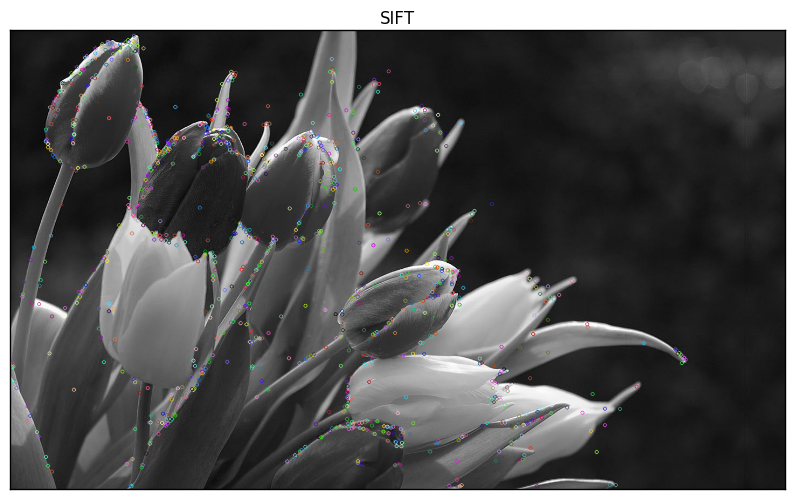

In [15]:
img = cv2.imread('Images\\flower.jpg')
gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

sift = cv2.xfeatures2d.SIFT_create()
kp = sift.detectAndCompute(gray,None)

#print("# kps: , descriptors: {}".format(len(kp)))

img=cv2.drawKeypoints(gray,kp[0],img)

f, ax = plt.subplots(1,1,figsize=(10, 10))
ax.imshow(img[:,:,::-1]), ax.set_xticks([]), ax.set_yticks([]), ax.set_title('SIFT')
plt.show()

### SURF (Speeded-Up Robust Features)
In SIFT, Lowe approximated Laplacian of Gaussian with Difference of Gaussian for finding scale-space. SURF goes a little further and approximates LoG with Box Filter. Below image shows a demonstration of such an approximation. One big advantage of this approximation is that, convolution with box filter can be easily calculated with the help of integral images. And it can be done in parallel for different scales. Also the SURF rely on determinant of Hessian matrix for both scale and location.

![Box Filter approximation of Laplacian](Images\surf_boxfilter.jpg)
For orientation assignment, SURF uses wavelet responses in horizontal and vertical direction for a neighbourhood of size 6s. Adequate guassian weights are also applied to it. Then they are plotted in a space as given in below image. The dominant orientation is estimated by calculating the sum of all responses within a sliding orientation window of angle 60 degrees. Interesting thing is that, wavelet response can be found out using integral images very easily at any scale. For many applications, rotation invariance is not required, so no need of finding this orientation, which speeds up the process. SURF provides such a functionality called Upright-SURF or U-SURF. It improves speed and is robust upto \pm 15^{\circ}. OpenCV supports both, depending upon the flag, upright. If it is 0, orientation is calculated. If it is 1, orientation is not calculated and it is more faster.

![Orientation Assignment in SURF](Images\surf_orientation.jpg)

For feature description, SURF uses Wavelet responses in horizontal and vertical direction (again, use of integral images makes things easier). A neighbourhood of size 20sX20s is taken around the keypoint where s is the size. It is divided into 4x4 subregions. For each subregion, horizontal and vertical wavelet responses are taken and a vector is formed like this, $v=( \sum{d_x}, \sum{d_y}, \sum{|d_x|}, \sum{|d_y|})$. This when represented as a vector gives SURF feature descriptor with total 64 dimensions. Lower the dimension, higher the speed of computation and matching, but provide better distinctiveness of features.

For more distinctiveness, SURF feature descriptor has an extended 128 dimension version. The sums of $d_x$ and $|d_x|$ are computed separately for $d_y < 0$ and $d_y \geq 0$. Similarly, the sums of $d_y$ and $|d_y|$ are split up according to the sign of $d_x$ , thereby doubling the number of features. It doesn’t add much computation complexity. OpenCV supports both by setting the value of flag extended with 0 and 1 for 64-dim and 128-dim respectively (default is 128-dim)

Another important improvement is the use of sign of Laplacian (trace of Hessian Matrix) for underlying interest point. It adds no computation cost since it is already computed during detection. The sign of the Laplacian distinguishes bright blobs on dark backgrounds from the reverse situation. In the matching stage, we only compare features if they have the same type of contrast (as shown in image below). This minimal information allows for faster matching, without reducing the descriptor’s performance.

![Fast Indexing for Matching](Images\surf_matching.jpg)

In short, SURF adds a lot of features to improve the speed in every step. Analysis shows it is 3 times faster than SIFT while performance is comparable to SIFT. SURF is good at handling images with blurring and rotation, but not good at handling viewpoint change and illumination change. You can find the function signature [here](http://docs.opencv.org/2.4/modules/nonfree/doc/feature_detection.html#surf)

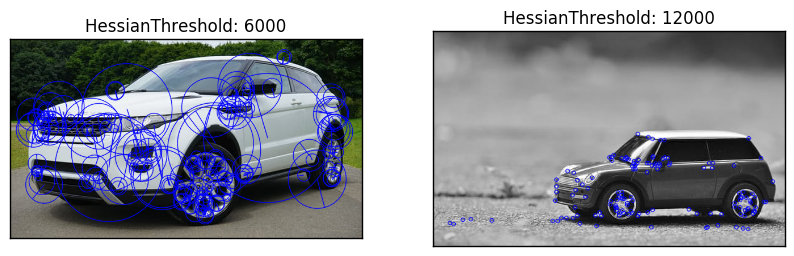

In [55]:
img = cv2.imread('Images\car.jpg')
img1 = np.copy(img)
surf = cv2.xfeatures2d.SURF_create(6000)
kp, des = surf.detectAndCompute(img,None)
img = cv2.drawKeypoints(img,kp,None,(255,0,0),4)
f, ax = plt.subplots(1,2,figsize=(10, 10))
ax[0].imshow(img[:,:,::-1]),ax[0].set_xticks([]),ax[0].set_yticks([]),ax[0].set_title('HessianThreshold: 6000')

surf = cv2.xfeatures2d.SURF_create(12000)
kp, des = surf.detectAndCompute(img,None)
img1 = cv2.drawKeypoints(img,kp,None,(255,0,0),4)
ax[1].imshow(img2[:,:,::-1]),ax[1].set_xticks([]),ax[1].set_yticks([]),ax[1].set_title('HessianThreshold: 12000')
plt.show()

### FAST (Features from Accelerated Segment Test) 
We saw several feature detectors and many of them are really good. But when looking from a real-time application point of view, they are not fast enough. As a solution to this, FAST (Features from Accelerated Segment Test) algorithm was proposed by Edward Rosten and Tom Drummond in their paper “Machine learning for high-speed corner detection” in 2006.
* Feature Detection using FAST
  1. Select a pixel $p$ in the image which is to be identified as an interest point or not. Let its intensity be $I_p$.
  2. Select appropriate threshold value $t$.
  3. Consider a circle of 16 pixels around the pixel under test. (See the image below):
  ![Fast algorithm](Images\fast_speedtest.jpg)
  4. Now the pixel p is a corner if there exists a set of n contiguous pixels in the circle (of 16 pixels) which are all brighter than $I_p + t$, or all darker than $I_p − t$. (Shown as white dash lines in the above image). $n$ was chosen to be 12.
  5. A high-speed test was proposed to exclude a large number of non-corners. This test examines only the four pixels at 1, 9, 5 and 13 (First 1 and 9 are tested if they are too brighter or darker. If so, then checks 5 and 13). If p is a corner, then at least three of these must all be brighter than I_p + t or darker than I_p − t. If neither of these is the case, then p cannot be a corner. The full segment test criterion can then be applied to the passed candidates by examining all pixels in the circle. This detector in itself exhibits high performance, but there are several weaknesses:
    * It does not reject as many candidates for n < 12.
    * The choice of pixels is not optimal because its efficiency depends on ordering of the questions and distribution of corner appearances.
    * Results of high-speed tests are thrown away.
    * Multiple features are detected adjacent to one another.
    
#### Non-maximal Suppression
Detecting multiple interest points in adjacent locations is another problem. It is solved by using Non-maximum Suppression.

* Compute a score function, $V$ for all the detected feature points. $V$ is the sum of absolute difference between $p$ and 16 surrounding pixels values.
* Consider two adjacent keypoints and compute their $V$ values.
* Discard the one with lower $V$ value.

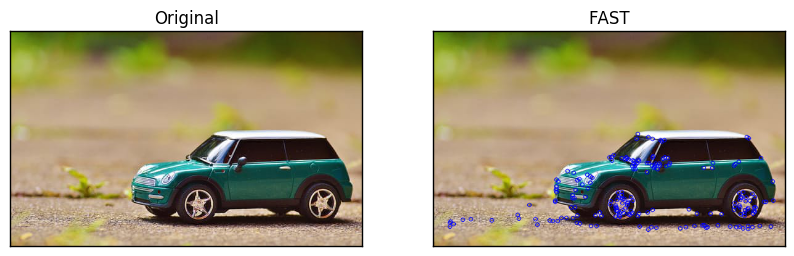

In [67]:
img = cv2.imread('Images\\mini.jpg')
out = np.zeros(img.shape)

# Initiate FAST object with default values
fast = cv2.FastFeatureDetector_create(60)

# find and draw the keypoints
kp = fast.detect(img,None)

f, ax = plt.subplots(1,2,figsize=(10, 10))
ax[0].imshow(img[:,:,::-1]),ax[0].set_xticks([]),ax[0].set_yticks([]),ax[0].set_title('Original')

img = cv2.drawKeypoints(img, kp,out, color=(255,0,0))             # Drawing out the keypoints on the img
ax[1].imshow(img[:,:,::-1]),ax[1].set_xticks([]),ax[1].set_yticks([]),ax[1].set_title('FAST')
plt.show()

### ORB (Oriented FAST and Rotated BRIEF)
ORB is basically a fusion of FAST keypoint detector and BRIEF descriptor with many modifications to enhance the performance. First it use FAST to find keypoints, then apply Harris corner measure to find top N points among them. It also use pyramid to produce multiscale-features. But one problem is that, FAST doesn’t compute the orientation. So what about rotation invariance? Authors came up with following modification.

It computes the intensity weighted centroid of the patch with located corner at center. The direction of the vector from this corner point to centroid gives the orientation. To improve the rotation invariance, moments are computed with x and y which should be in a circular region of radius $r$, where $r$ is the size of the patch.

Now for descriptors, ORB use BRIEF descriptors. But we have already seen that BRIEF performs poorly with rotation. So what ORB does is to “steer” BRIEF according to the orientation of keypoints. For any feature set of n binary tests at location $(x_i, y_i)$, define a $2 \times n$ matrix, $S$ which contains the coordinates of these pixels. Then using the orientation of patch, $\theta$, its rotation matrix is found and rotates the $S$ to get steered(rotated) version $S_\theta$.

ORB discretize the angle to increments of $2 \pi /30$ (12 degrees), and construct a lookup table of precomputed BRIEF patterns. As long as the keypoint orientation $\theta$ is consistent across views, the correct set of points $S_\theta$ will be used to compute its descriptor.

BRIEF has an important property that each bit feature has a large variance and a mean near 0.5. But once it is oriented along keypoint direction, it loses this property and become more distributed. High variance makes a feature more discriminative, since it responds differentially to inputs. Another desirable property is to have the tests uncorrelated, since then each test will contribute to the result. To resolve all these, ORB runs a greedy search among all possible binary tests to find the ones that have both high variance and means close to 0.5, as well as being uncorrelated. The result is called $rBRIEF$.

For descriptor matching, multi-probe LSH which improves on the traditional LSH, is used. The paper says ORB is much faster than SURF and SIFT and ORB descriptor works better than SURF. ORB is a good choice in low-power devices for panorama stitching etc.

As usual, we have to create an ORB object with the function, cv2.ORB() or using feature2d common interface. It has a number of optional parameters. Most useful ones are nFeatures which denotes maximum number of features to be retained (by default 500), scoreType which denotes whether Harris score or FAST score to rank the features (by default, Harris score) etc. Another parameter, WTA_K decides number of points that produce each element of the oriented BRIEF descriptor. By default it is two, ie selects two points at a time. In that case, for matching, NORM_HAMMING distance is used. If WTA_K is 3 or 4, which takes 3 or 4 points to produce BRIEF descriptor, then matching distance is defined by NORM_HAMMING2.

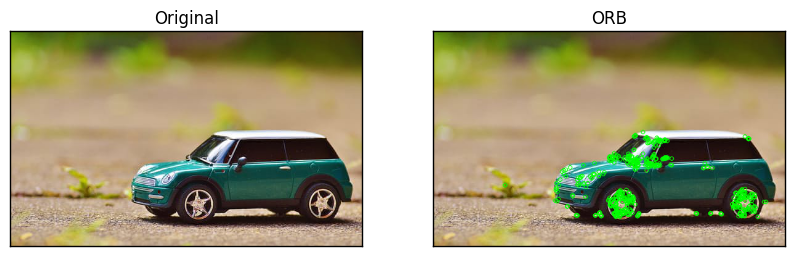

In [2]:
img = cv2.imread('Images\\mini.jpg')
out = np.zeros(img.shape)

# Initiate STAR detector
orb = cv2.ORB_create()

# find the keypoints with ORB
kp = orb.detect(img,None)

# compute the descriptors with ORB
kp, des = orb.compute(img, kp)

f, ax = plt.subplots(1,2,figsize=(10, 10))
ax[0].imshow(img[:,:,::-1]),ax[0].set_xticks([]),ax[0].set_yticks([]),ax[0].set_title('Original')

# draw only keypoints location,not size and orientation
img = cv2.drawKeypoints(img,kp,out,color=(0,255,0), flags=0)

ax[1].imshow(img[:,:,::-1]),ax[1].set_xticks([]),ax[1].set_yticks([]),ax[1].set_title('ORB')
plt.show()

### Brute-Force Matcher
Brute-Force matcher is simple. It takes the descriptor of one feature in first set and is matched with all other features in second set using some distance calculation. And the closest one is returned.

For BF matcher, first we have to create the BFMatcher object using cv2.BFMatcher(). It takes two optional params. First one is normType. It specifies the distance measurement to be used. By default, it is cv2.NORM_L2. It is good for SIFT, SURF etc (cv2.NORM_L1 is also there). For binary string based descriptors like ORB, BRIEF, BRISK etc, cv2.NORM_HAMMING should be used, which used Hamming distance as measurement. If ORB is using WTA_K == 3 or 4, cv2.NORM_HAMMING2 should be used.

Second param is boolean variable, crossCheck which is false by default. If it is true, Matcher returns only those matches with value (i,j) such that i-th descriptor in set A has j-th descriptor in set B as the best match and vice-versa. That is, the two features in both sets should match each other. It provides consistant result, and is a good alternative to ratio test proposed by D.Lowe in SIFT paper.

Once it is created, two important methods are BFMatcher.match() and BFMatcher.knnMatch(). First one returns the best match. Second method returns k best matches where k is specified by the user. It may be useful when we need to do additional work on that.

Like we used cv2.drawKeypoints() to draw keypoints, cv2.drawMatches() helps us to draw the matches. It stacks two images horizontally and draw lines from first image to second image showing best matches. There is also cv2.drawMatchesKnn which draws all the k best matches. If k=2, it will draw two match-lines for each keypoint. So we have to pass a mask if we want to selectively draw it.

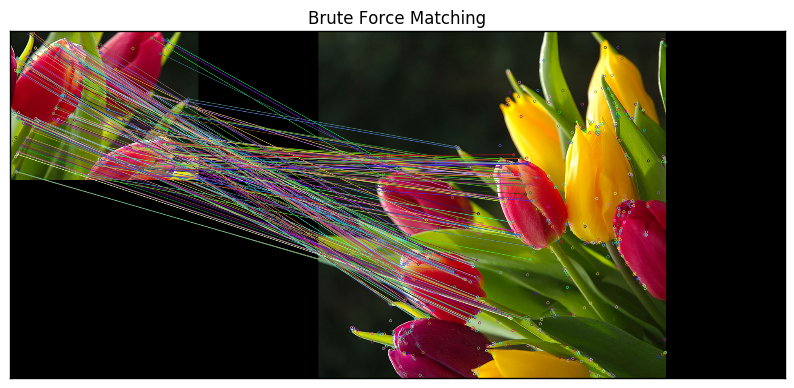

In [84]:
img1 = cv2.imread('Images\\flower-medium.png')# queryImage
img2 = cv2.imread('Images\\flower.jpg') # trainImage


#Rotating the second image
row, col = img2.shape[:2]
M = cv2.getRotationMatrix2D((col/2,row/2),90,1)
img2 = cv2.warpAffine(img2,M,(col,row))


# Initiate SIFT detector
sift= cv2.xfeatures2d.SIFT_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

# BFMatcher with default params
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1,des2, k=2)

# Apply ratio test
good = []
for m,n in matches:
    if m.distance < 0.75*n.distance:
        good.append([m])

# cv2.drawMatchesKnn expects list of lists as matches.
img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,good,2)

f, ax = plt.subplots(1,1,figsize=(10, 10))
ax.imshow(img3[:,:,::-1]),ax.set_xticks([]),ax.set_yticks([]),ax.set_title('Brute Force Matching')
plt.show()

### BRIEF (Binary Robust Independent Elementary Features)
We know SIFT uses 128-dim vector for descriptors. Since it is using floating point numbers, it takes basically 512 bytes. Similarly SURF also takes minimum of 256 bytes (for 64-dim). Creating such a vector for thousands of features takes a lot of memory which are not feasible for resouce-constraint applications especially for embedded systems. Larger the memory, longer the time it takes for matching.

But all these dimensions may not be needed for actual matching. We can compress it using several methods like PCA, LDA etc. Even other methods like hashing using LSH (Locality Sensitive Hashing) is used to convert these SIFT descriptors in floating point numbers to binary strings. These binary strings are used to match features using Hamming distance. This provides better speed-up because finding hamming distance is just applying XOR and bit count, which are very fast in modern CPUs with SSE instructions. But here, we need to find the descriptors first, then only we can apply hashing, which doesn’t solve our initial problem on memory.

BRIEF comes into picture at this moment. It provides a shortcut to find the binary strings directly without finding descriptors. It takes smoothened image patch and selects a set of $n_d$ (x,y) location pairs in an unique way (explained in paper). Then some pixel intensity comparisons are done on these location pairs. For eg, let first location pairs be $p$ and $q$. If $I(p) < I(q)$, then its result is 1, else it is 0. This is applied for all the $n_d$ location pairs to get a $n_d$ -dimensional bitstring.

This $n_d$ can be 128, 256 or 512. OpenCV supports all of these, but by default, it would be 256 (OpenCV represents it in bytes. So the values will be 16, 32 and 64). So once you get this, you can use Hamming Distance to match these descriptors.

One important point is that BRIEF is a feature descriptor, it doesn’t provide any method to find the features. So you will have to use any other feature detectors like SIFT, SURF etc. The paper recommends to use CenSurE which is a fast detector and BRIEF works even slightly better for CenSurE points than for SURF points.

In short, BRIEF is a faster method feature descriptor calculation and matching. It also provides high recognition rate unless there is large in-plane rotation.

In [90]:
import sys
img = cv2.imread('Images\\close.jpg',0)

# Initiate STAR detector
star = cv2.xfeatures2d.StarDetector_create()

# Initiate BRIEF extractor
brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()

# find the keypoints with STAR
kp = star.detect(img,None)

# compute the descriptors with BRIEF
kp, des = brief.compute(img, kp)

print('Size of the descriptor in Bytes: {}'.format(sys.getsizeof(brief)))
print('Shape of the descriptor: {}'.format(des.shape)) 

Size of the descriptor in Bytes: 32
Shape of the descriptor: (2513L, 32L)
